# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [19]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [20]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

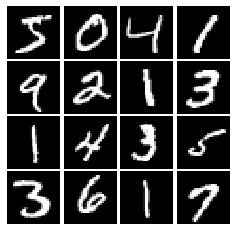

In [21]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [22]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    return tf.maximum(x, alpha*x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [23]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [24]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    return tf.random.uniform(shape=[batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [25]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [26]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [27]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [28]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.InputLayer((noise_dim,)),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation='tanh'),


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [29]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [30]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss_r = bce(tf.ones(logits_real.shape), logits_real)
    loss_f = bce(tf.zeros(logits_fake.shape), logits_fake)
    loss = loss_r + loss_f
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones(logits_fake.shape), logits_fake)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [31]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [32]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [33]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [34]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.488, G:0.7322


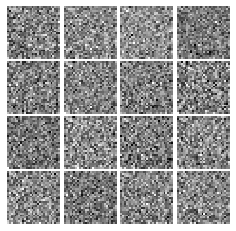

Epoch: 0, Iter: 20, D: 0.6115, G:0.8948


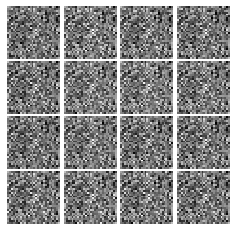

Epoch: 0, Iter: 40, D: 0.4987, G:1.005


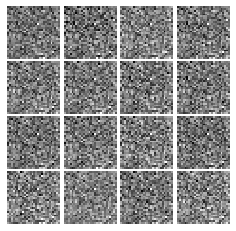

Epoch: 0, Iter: 60, D: 0.875, G:0.8449


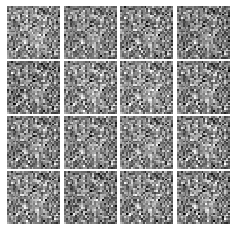

Epoch: 0, Iter: 80, D: 0.651, G:1.908


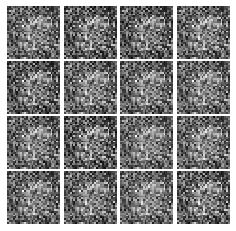

Epoch: 0, Iter: 100, D: 1.01, G:1.158


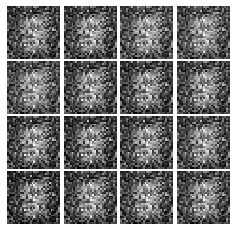

Epoch: 0, Iter: 120, D: 1.436, G:1.385


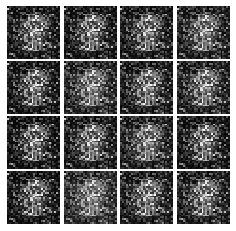

Epoch: 0, Iter: 140, D: 1.053, G:1.448


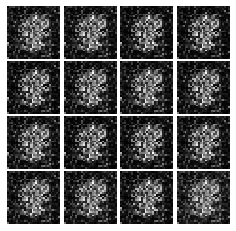

Epoch: 0, Iter: 160, D: 1.147, G:2.15


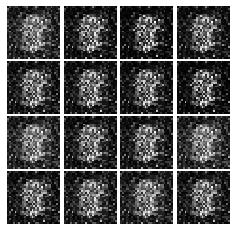

Epoch: 0, Iter: 180, D: 0.7738, G:1.602


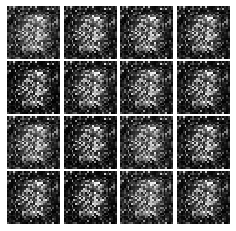

Epoch: 0, Iter: 200, D: 0.8996, G:2.087


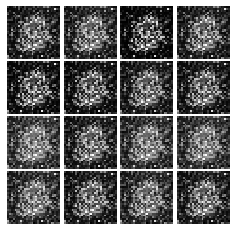

Epoch: 0, Iter: 220, D: 0.7815, G:1.669


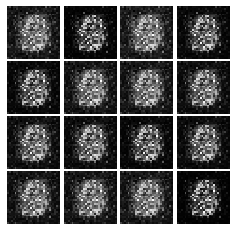

Epoch: 0, Iter: 240, D: 1.005, G:1.454


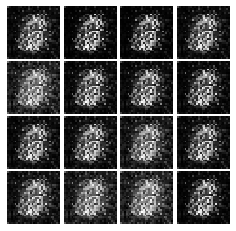

Epoch: 0, Iter: 260, D: 0.4905, G:1.922


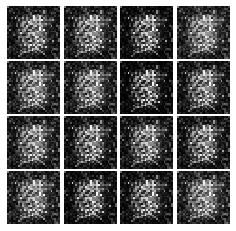

Epoch: 0, Iter: 280, D: 0.9256, G:1.541


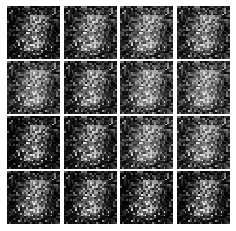

Epoch: 0, Iter: 300, D: 2.792, G:2.03


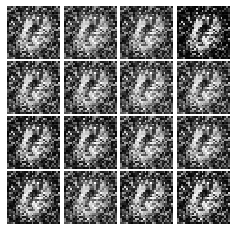

Epoch: 0, Iter: 320, D: 1.69, G:2.344


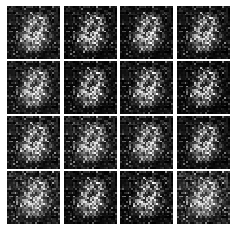

Epoch: 0, Iter: 340, D: 0.9484, G:0.9208


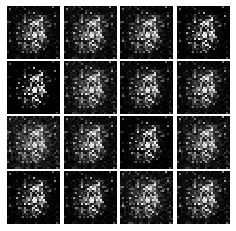

Epoch: 0, Iter: 360, D: 1.209, G:1.255


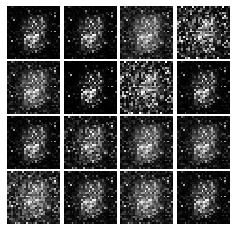

Epoch: 0, Iter: 380, D: 0.9777, G:2.575


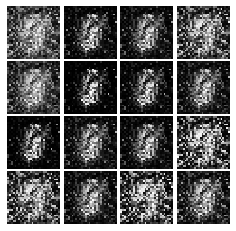

Epoch: 0, Iter: 400, D: 1.101, G:1.654


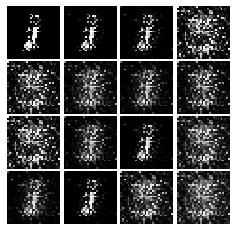

Epoch: 0, Iter: 420, D: 0.9101, G:2.272


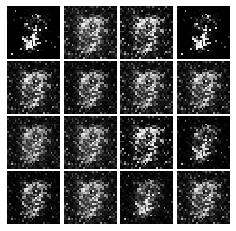

Epoch: 0, Iter: 440, D: 1.383, G:0.6103


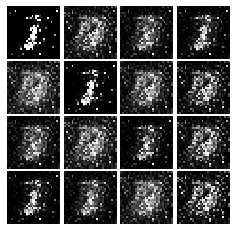

Epoch: 0, Iter: 460, D: 1.163, G:2.118


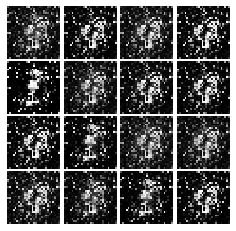

Epoch: 1, Iter: 480, D: 1.176, G:1.192


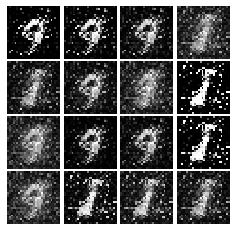

Epoch: 1, Iter: 500, D: 1.055, G:1.332


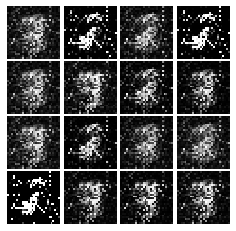

Epoch: 1, Iter: 520, D: 1.594, G:2.944


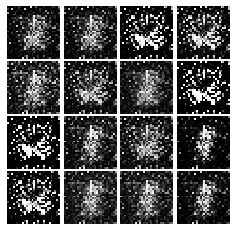

Epoch: 1, Iter: 540, D: 0.9943, G:2.136


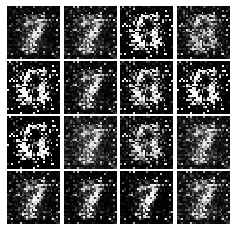

Epoch: 1, Iter: 560, D: 1.198, G:0.9269


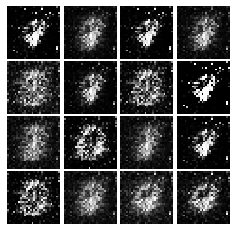

Epoch: 1, Iter: 580, D: 1.392, G:0.9352


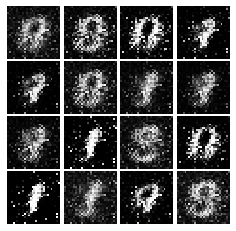

Epoch: 1, Iter: 600, D: 1.234, G:1.73


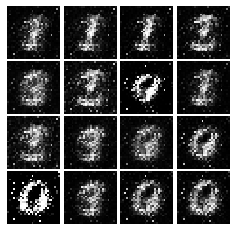

Epoch: 1, Iter: 620, D: 1.3, G:1.256


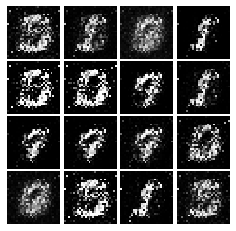

Epoch: 1, Iter: 640, D: 1.203, G:1.078


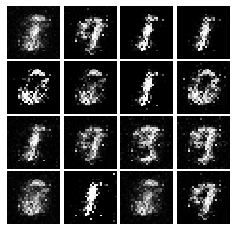

Epoch: 1, Iter: 660, D: 1.113, G:1.081


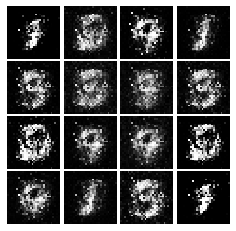

Epoch: 1, Iter: 680, D: 0.9723, G:1.166


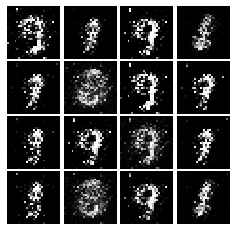

Epoch: 1, Iter: 700, D: 1.418, G:1.318


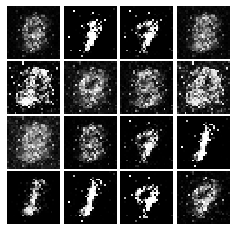

Epoch: 1, Iter: 720, D: 1.547, G:0.7853


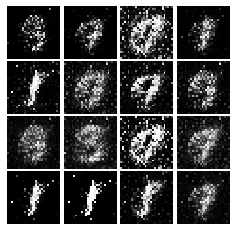

Epoch: 1, Iter: 740, D: 1.424, G:0.7608


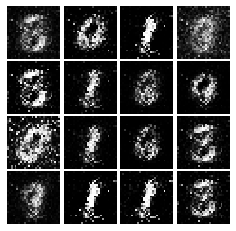

Epoch: 1, Iter: 760, D: 1.217, G:1.214


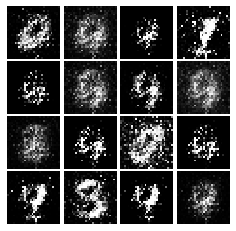

Epoch: 1, Iter: 780, D: 1.242, G:1.144


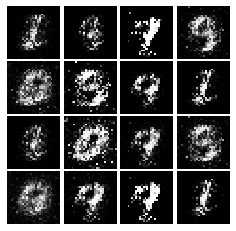

Epoch: 1, Iter: 800, D: 1.285, G:0.9818


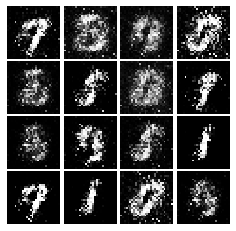

Epoch: 1, Iter: 820, D: 1.233, G:1.269


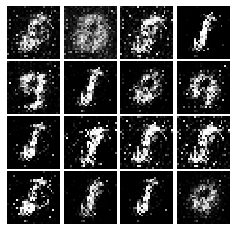

Epoch: 1, Iter: 840, D: 1.144, G:1.625


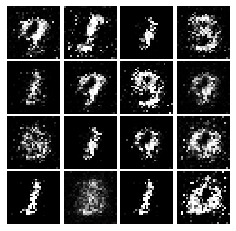

Epoch: 1, Iter: 860, D: 1.179, G:1.192


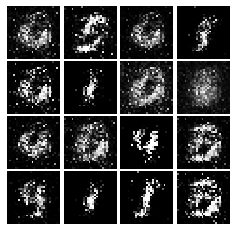

Epoch: 1, Iter: 880, D: 1.168, G:0.999


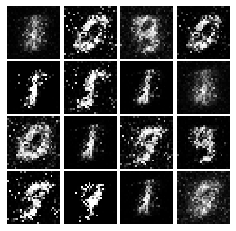

Epoch: 1, Iter: 900, D: 1.377, G:2.011


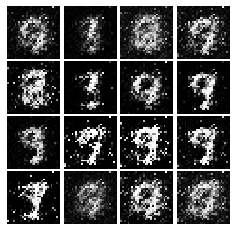

Epoch: 1, Iter: 920, D: 1.281, G:1.469


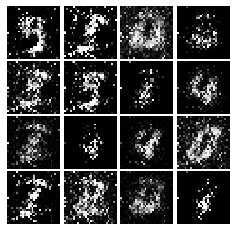

Epoch: 2, Iter: 940, D: 1.259, G:1.41


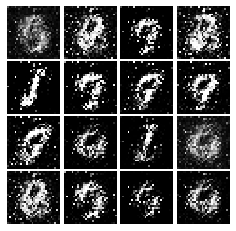

Epoch: 2, Iter: 960, D: 1.234, G:1.22


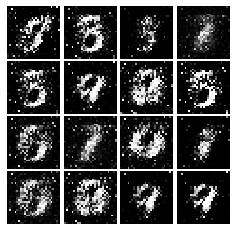

Epoch: 2, Iter: 980, D: 1.06, G:1.157


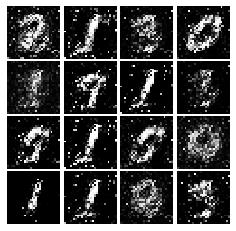

Epoch: 2, Iter: 1000, D: 1.212, G:1.503


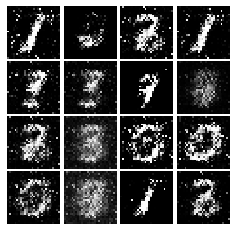

Epoch: 2, Iter: 1020, D: 1.433, G:1.419


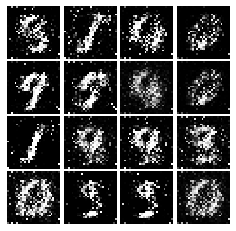

Epoch: 2, Iter: 1040, D: 1.116, G:3.464


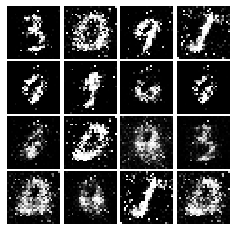

Epoch: 2, Iter: 1060, D: 1.323, G:0.9564


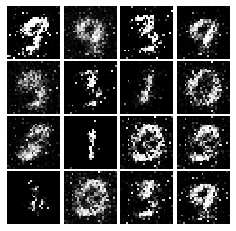

Epoch: 2, Iter: 1080, D: 1.094, G:1.225


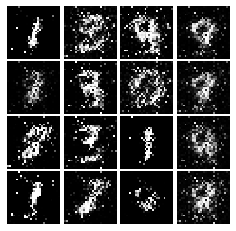

Epoch: 2, Iter: 1100, D: 1.25, G:1.58


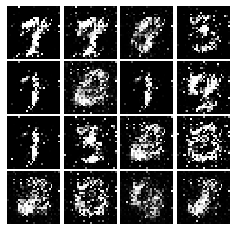

Epoch: 2, Iter: 1120, D: 1.357, G:1.399


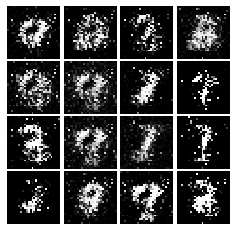

Epoch: 2, Iter: 1140, D: 1.242, G:0.8923


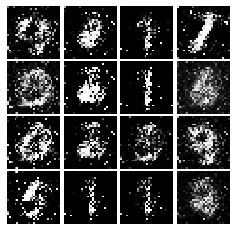

Epoch: 2, Iter: 1160, D: 1.421, G:0.5787


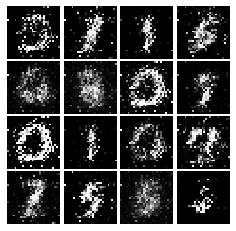

Epoch: 2, Iter: 1180, D: 1.118, G:1.344


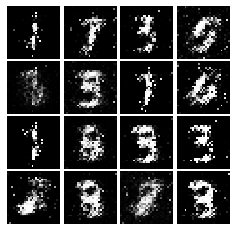

Epoch: 2, Iter: 1200, D: 1.324, G:0.9088


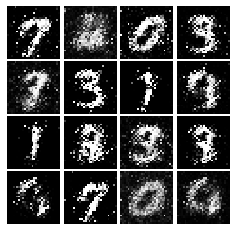

Epoch: 2, Iter: 1220, D: 1.05, G:1.224


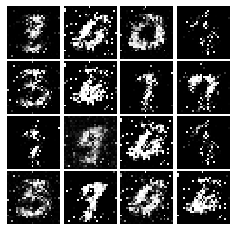

Epoch: 2, Iter: 1240, D: 1.158, G:0.9816


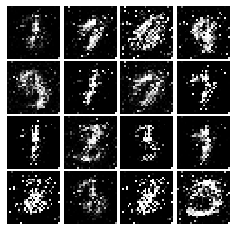

Epoch: 2, Iter: 1260, D: 1.402, G:0.9817


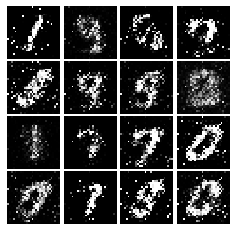

Epoch: 2, Iter: 1280, D: 1.155, G:1.113


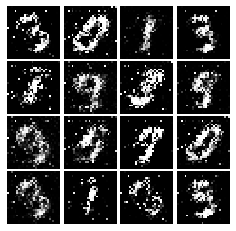

Epoch: 2, Iter: 1300, D: 1.3, G:0.8374


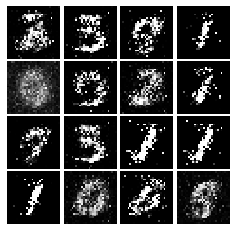

Epoch: 2, Iter: 1320, D: 1.367, G:0.8519


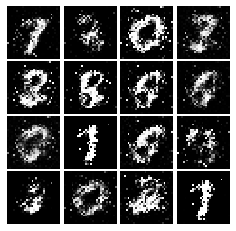

Epoch: 2, Iter: 1340, D: 1.333, G:0.7677


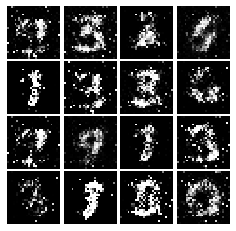

Epoch: 2, Iter: 1360, D: 1.273, G:0.9518


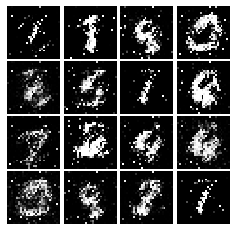

Epoch: 2, Iter: 1380, D: 1.157, G:1.003


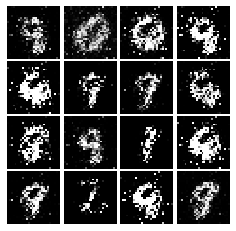

Epoch: 2, Iter: 1400, D: 1.227, G:1.206


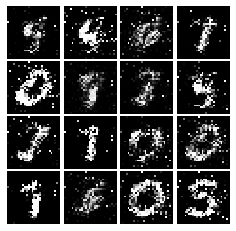

Epoch: 3, Iter: 1420, D: 1.155, G:1.122


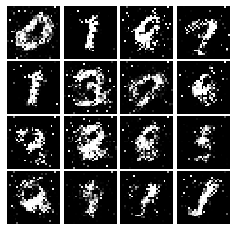

Epoch: 3, Iter: 1440, D: 1.231, G:1.075


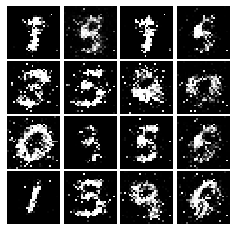

Epoch: 3, Iter: 1460, D: 1.121, G:0.8024


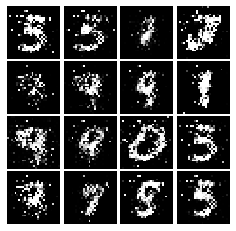

Epoch: 3, Iter: 1480, D: 1.298, G:0.9507


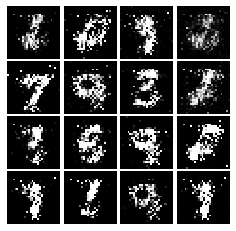

Epoch: 3, Iter: 1500, D: 1.264, G:0.7791


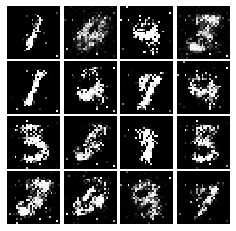

Epoch: 3, Iter: 1520, D: 1.194, G:1.109


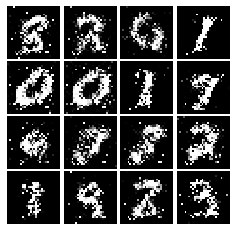

Epoch: 3, Iter: 1540, D: 1.366, G:0.8934


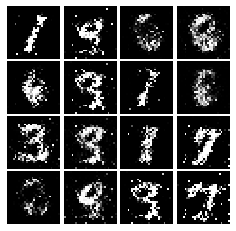

Epoch: 3, Iter: 1560, D: 1.176, G:1.256


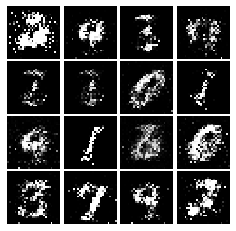

Epoch: 3, Iter: 1580, D: 1.309, G:0.5218


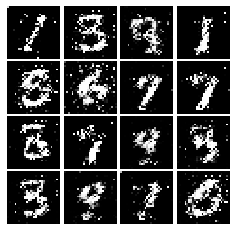

Epoch: 3, Iter: 1600, D: 1.241, G:0.9238


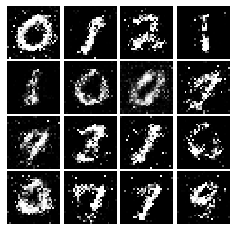

Epoch: 3, Iter: 1620, D: 1.104, G:0.8392


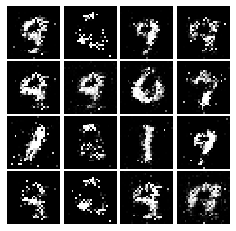

Epoch: 3, Iter: 1640, D: 1.246, G:0.9369


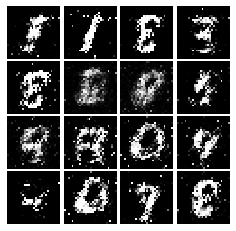

Epoch: 3, Iter: 1660, D: 1.174, G:0.8932


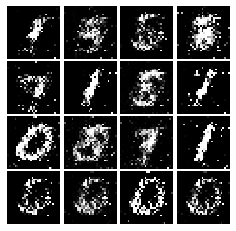

Epoch: 3, Iter: 1680, D: 1.258, G:0.9211


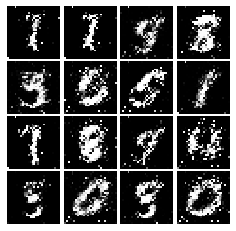

Epoch: 3, Iter: 1700, D: 1.278, G:0.8152


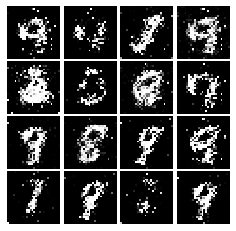

Epoch: 3, Iter: 1720, D: 1.338, G:1.078


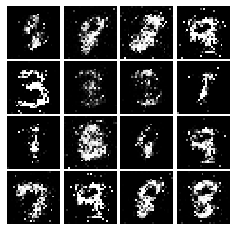

Epoch: 3, Iter: 1740, D: 1.241, G:1.046


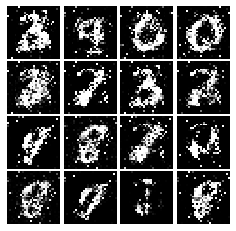

Epoch: 3, Iter: 1760, D: 1.148, G:1.148


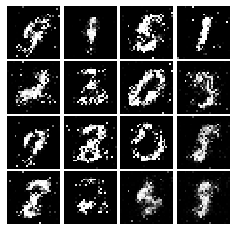

Epoch: 3, Iter: 1780, D: 1.312, G:1.043


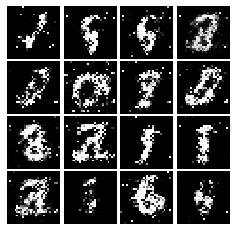

Epoch: 3, Iter: 1800, D: 1.347, G:0.6978


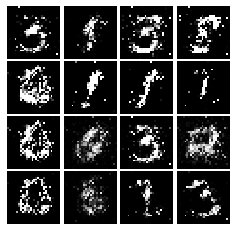

Epoch: 3, Iter: 1820, D: 1.229, G:0.8458


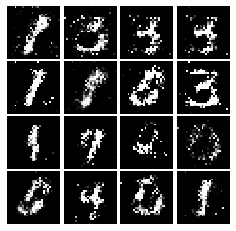

Epoch: 3, Iter: 1840, D: 1.262, G:0.8755


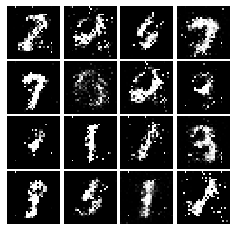

Epoch: 3, Iter: 1860, D: 1.459, G:0.8436


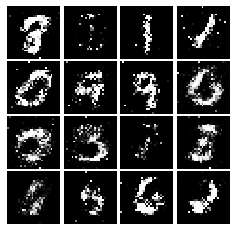

Epoch: 4, Iter: 1880, D: 1.284, G:0.9315


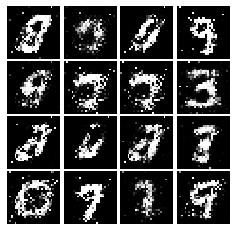

Epoch: 4, Iter: 1900, D: 1.314, G:0.7716


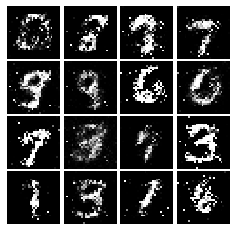

Epoch: 4, Iter: 1920, D: 1.322, G:0.9174


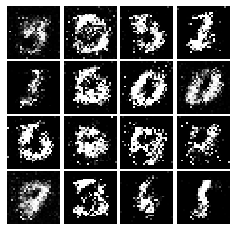

Epoch: 4, Iter: 1940, D: 1.306, G:0.8241


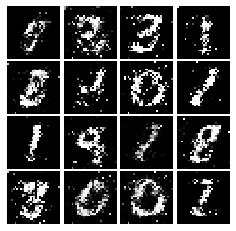

Epoch: 4, Iter: 1960, D: 1.328, G:0.9075


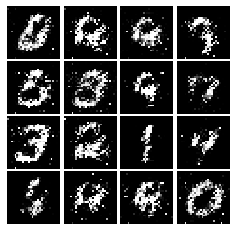

Epoch: 4, Iter: 1980, D: 1.403, G:1.043


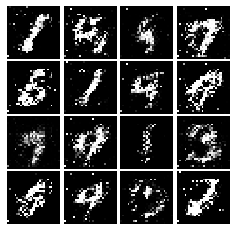

Epoch: 4, Iter: 2000, D: 1.352, G:0.7806


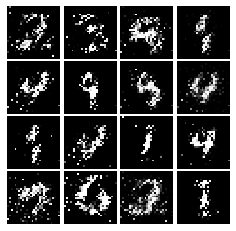

Epoch: 4, Iter: 2020, D: 1.291, G:0.803


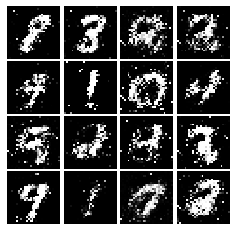

Epoch: 4, Iter: 2040, D: 1.271, G:0.9028


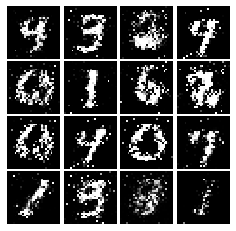

Epoch: 4, Iter: 2060, D: 1.315, G:0.9727


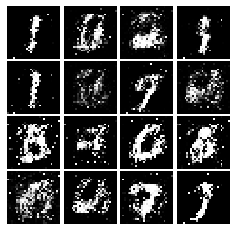

Epoch: 4, Iter: 2080, D: 1.33, G:0.8381


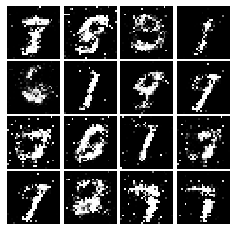

Epoch: 4, Iter: 2100, D: 1.374, G:0.8709


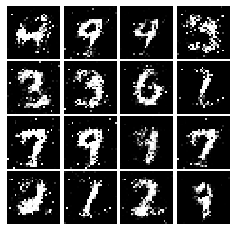

Epoch: 4, Iter: 2120, D: 1.26, G:0.7553


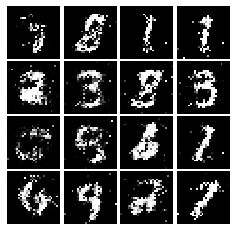

Epoch: 4, Iter: 2140, D: 1.323, G:1.327


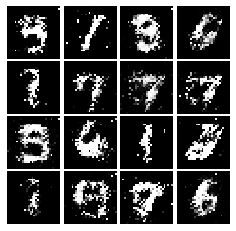

Epoch: 4, Iter: 2160, D: 1.294, G:0.8675


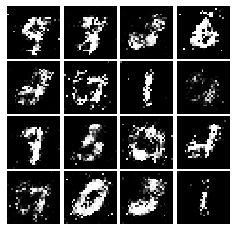

Epoch: 4, Iter: 2180, D: 1.314, G:0.8479


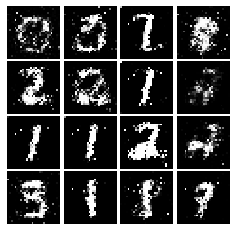

Epoch: 4, Iter: 2200, D: 1.328, G:0.9621


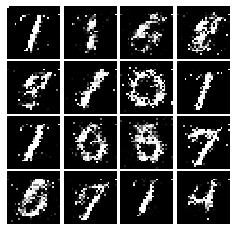

Epoch: 4, Iter: 2220, D: 1.37, G:0.8911


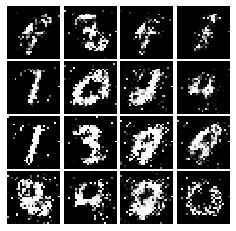

Epoch: 4, Iter: 2240, D: 1.247, G:0.8642


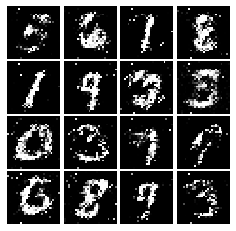

Epoch: 4, Iter: 2260, D: 1.35, G:0.8773


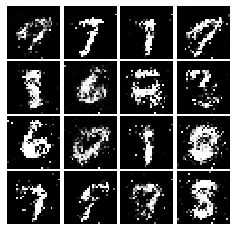

Epoch: 4, Iter: 2280, D: 1.506, G:1.32


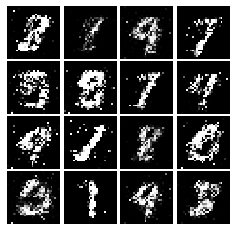

Epoch: 4, Iter: 2300, D: 1.244, G:0.8921


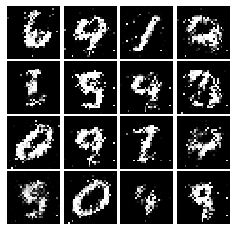

Epoch: 4, Iter: 2320, D: 1.217, G:1.078


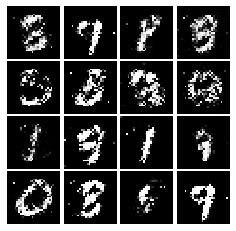

Epoch: 4, Iter: 2340, D: 1.393, G:0.8956


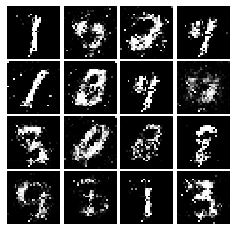

Epoch: 5, Iter: 2360, D: 1.299, G:0.8113


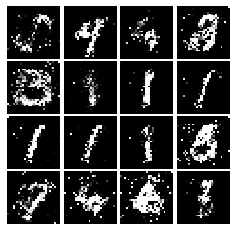

Epoch: 5, Iter: 2380, D: 1.362, G:0.8415


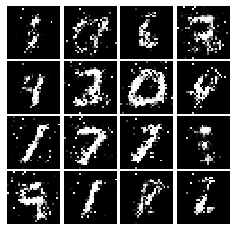

Epoch: 5, Iter: 2400, D: 1.318, G:0.8598


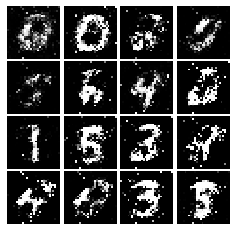

Epoch: 5, Iter: 2420, D: 1.271, G:0.8075


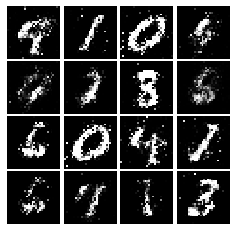

Epoch: 5, Iter: 2440, D: 1.268, G:0.8156


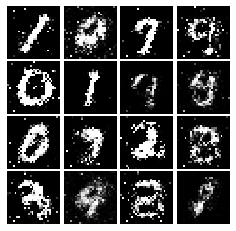

Epoch: 5, Iter: 2460, D: 1.187, G:0.8626


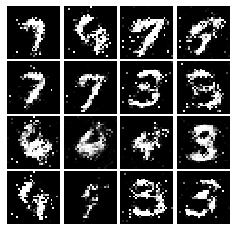

Epoch: 5, Iter: 2480, D: 1.302, G:0.8007


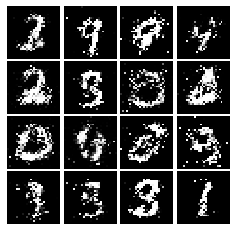

Epoch: 5, Iter: 2500, D: 1.252, G:0.8351


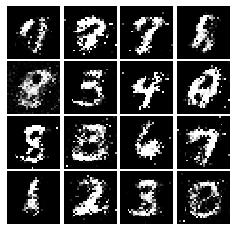

Epoch: 5, Iter: 2520, D: 1.315, G:0.9413


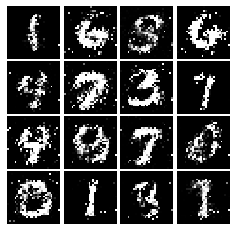

Epoch: 5, Iter: 2540, D: 1.375, G:0.8116


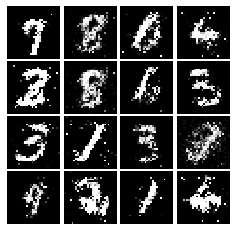

Epoch: 5, Iter: 2560, D: 1.227, G:0.8454


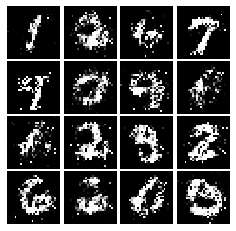

Epoch: 5, Iter: 2580, D: 1.317, G:1.01


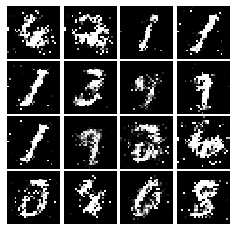

Epoch: 5, Iter: 2600, D: 1.404, G:0.7892


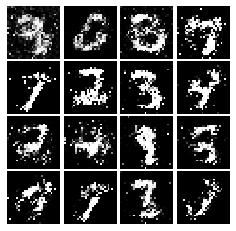

Epoch: 5, Iter: 2620, D: 1.314, G:0.851


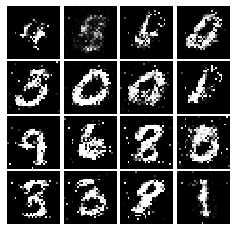

Epoch: 5, Iter: 2640, D: 1.424, G:0.9682


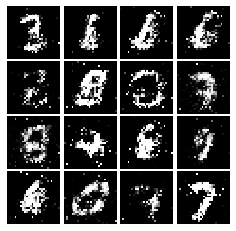

Epoch: 5, Iter: 2660, D: 1.294, G:0.8513


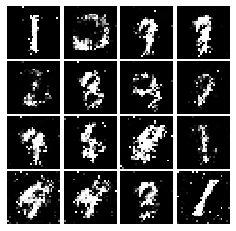

Epoch: 5, Iter: 2680, D: 1.306, G:0.8237


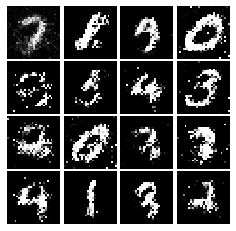

Epoch: 5, Iter: 2700, D: 1.384, G:0.8779


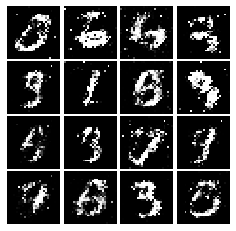

Epoch: 5, Iter: 2720, D: 1.295, G:0.8009


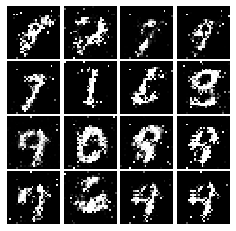

Epoch: 5, Iter: 2740, D: 1.26, G:0.8999


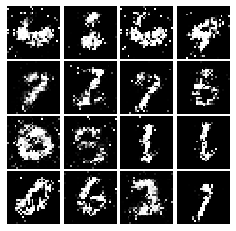

Epoch: 5, Iter: 2760, D: 1.27, G:0.9327


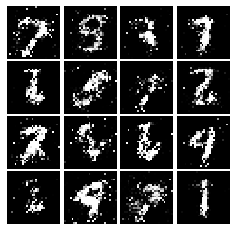

Epoch: 5, Iter: 2780, D: 1.29, G:0.8282


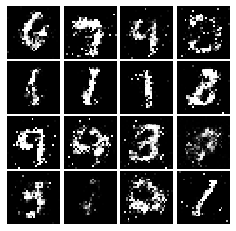

Epoch: 5, Iter: 2800, D: 1.354, G:0.8164


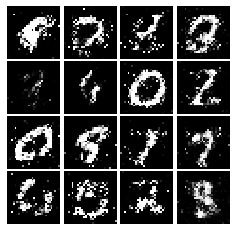

Epoch: 6, Iter: 2820, D: 1.329, G:0.7212


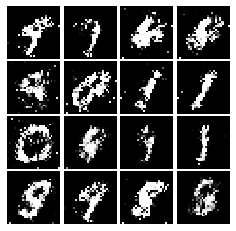

Epoch: 6, Iter: 2840, D: 1.306, G:0.7886


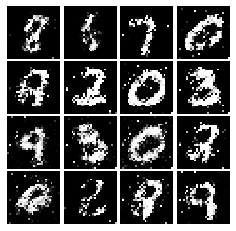

Epoch: 6, Iter: 2860, D: 1.333, G:0.7916


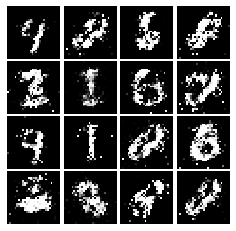

Epoch: 6, Iter: 2880, D: 1.417, G:0.7793


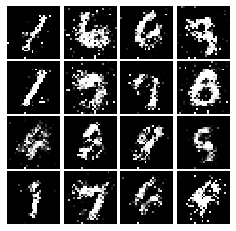

Epoch: 6, Iter: 2900, D: 1.343, G:0.9182


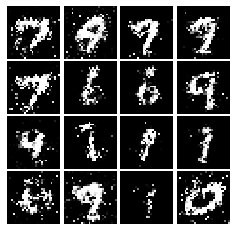

Epoch: 6, Iter: 2920, D: 1.339, G:0.792


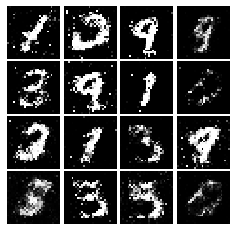

Epoch: 6, Iter: 2940, D: 1.43, G:0.7419


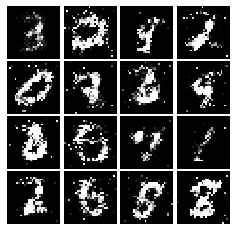

Epoch: 6, Iter: 2960, D: 1.322, G:0.8516


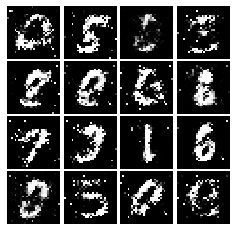

Epoch: 6, Iter: 2980, D: 1.377, G:0.8905


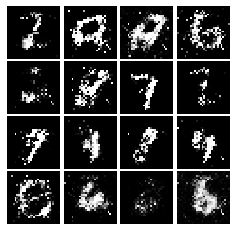

Epoch: 6, Iter: 3000, D: 1.376, G:0.7925


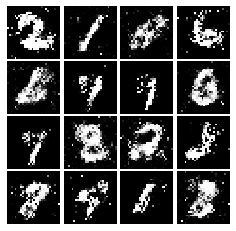

Epoch: 6, Iter: 3020, D: 1.337, G:0.9657


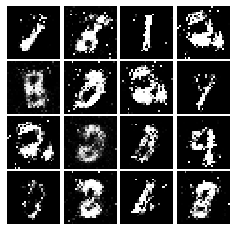

Epoch: 6, Iter: 3040, D: 1.324, G:0.9085


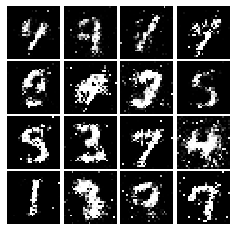

Epoch: 6, Iter: 3060, D: 1.331, G:0.8118


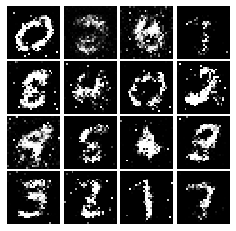

Epoch: 6, Iter: 3080, D: 1.407, G:1.102


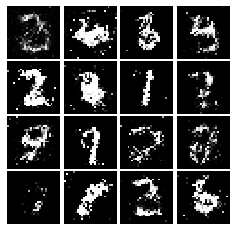

Epoch: 6, Iter: 3100, D: 1.326, G:0.7961


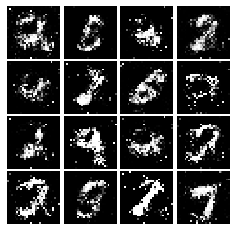

Epoch: 6, Iter: 3120, D: 1.349, G:0.8283


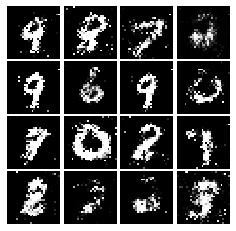

Epoch: 6, Iter: 3140, D: 1.331, G:0.8103


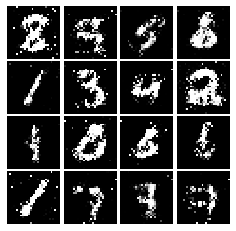

Epoch: 6, Iter: 3160, D: 1.308, G:0.9753


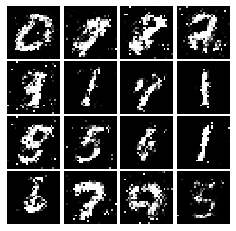

Epoch: 6, Iter: 3180, D: 1.326, G:0.733


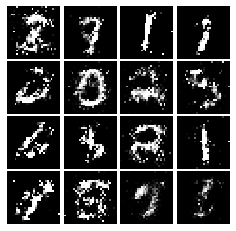

Epoch: 6, Iter: 3200, D: 1.285, G:0.8484


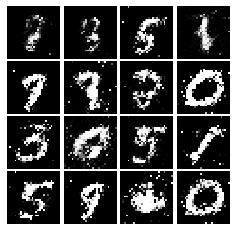

Epoch: 6, Iter: 3220, D: 1.245, G:0.7192


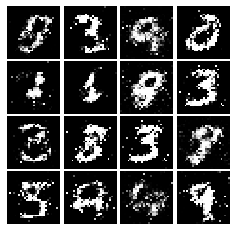

Epoch: 6, Iter: 3240, D: 1.297, G:0.7611


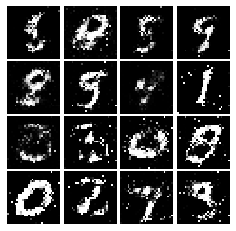

Epoch: 6, Iter: 3260, D: 1.345, G:0.7675


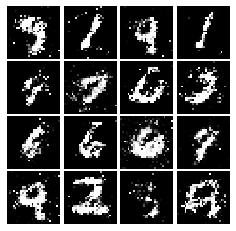

Epoch: 6, Iter: 3280, D: 1.283, G:0.7946


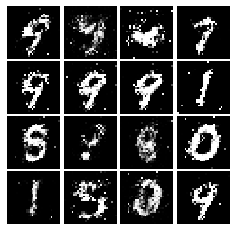

Epoch: 7, Iter: 3300, D: 1.244, G:0.7325


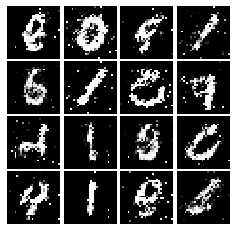

Epoch: 7, Iter: 3320, D: 1.26, G:0.8836


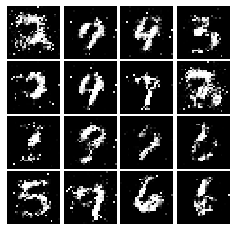

Epoch: 7, Iter: 3340, D: 1.226, G:0.8624


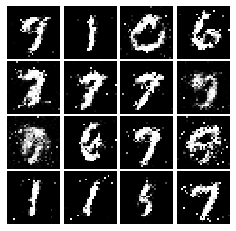

Epoch: 7, Iter: 3360, D: 1.335, G:0.8288


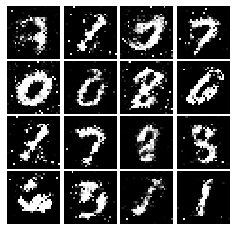

Epoch: 7, Iter: 3380, D: 1.336, G:0.8593


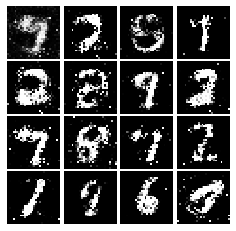

Epoch: 7, Iter: 3400, D: 1.43, G:0.8424


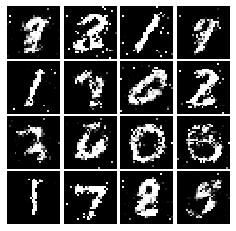

Epoch: 7, Iter: 3420, D: 1.41, G:0.7869


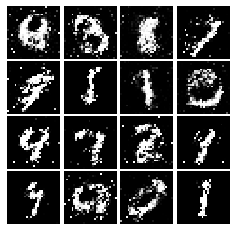

Epoch: 7, Iter: 3440, D: 1.35, G:0.7589


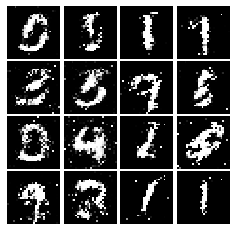

Epoch: 7, Iter: 3460, D: 1.264, G:0.7832


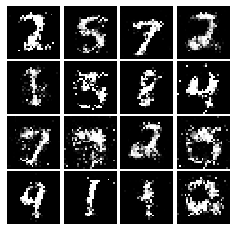

Epoch: 7, Iter: 3480, D: 1.382, G:0.7678


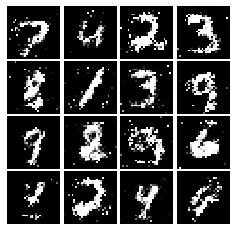

Epoch: 7, Iter: 3500, D: 1.315, G:0.8589


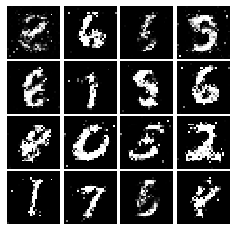

Epoch: 7, Iter: 3520, D: 1.452, G:0.752


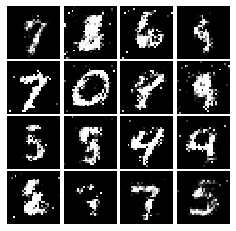

Epoch: 7, Iter: 3540, D: 1.31, G:0.8119


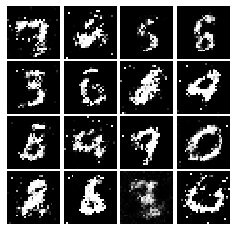

Epoch: 7, Iter: 3560, D: 1.355, G:0.9478


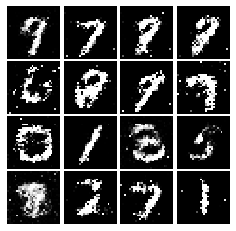

Epoch: 7, Iter: 3580, D: 1.289, G:0.7927


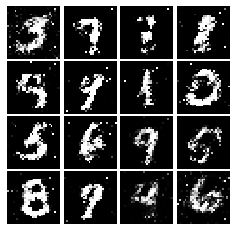

Epoch: 7, Iter: 3600, D: 1.291, G:0.8168


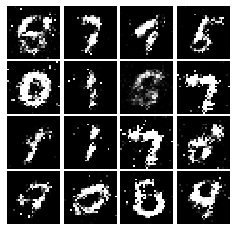

Epoch: 7, Iter: 3620, D: 1.361, G:0.8509


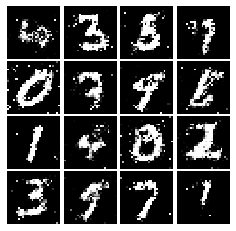

Epoch: 7, Iter: 3640, D: 1.328, G:0.7892


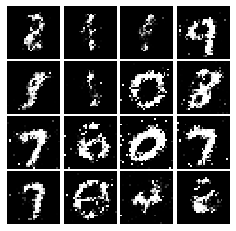

Epoch: 7, Iter: 3660, D: 1.314, G:0.8375


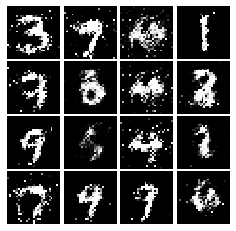

Epoch: 7, Iter: 3680, D: 1.37, G:0.806


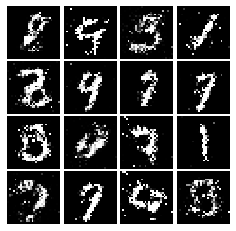

Epoch: 7, Iter: 3700, D: 1.405, G:0.7496


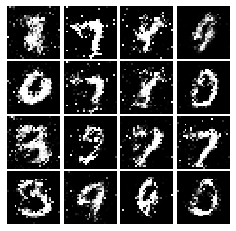

Epoch: 7, Iter: 3720, D: 1.267, G:0.9615


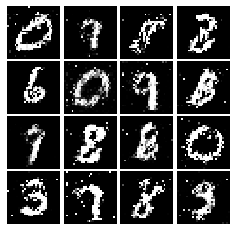

Epoch: 7, Iter: 3740, D: 1.397, G:0.8614


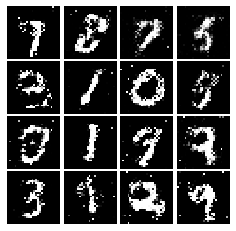

Epoch: 8, Iter: 3760, D: 1.347, G:0.8902


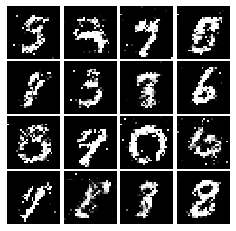

Epoch: 8, Iter: 3780, D: 1.37, G:0.9574


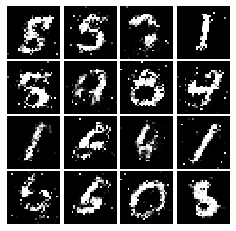

Epoch: 8, Iter: 3800, D: 1.314, G:0.7401


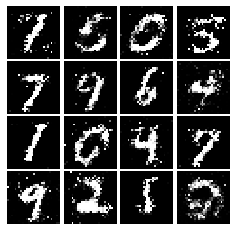

Epoch: 8, Iter: 3820, D: 1.364, G:0.7745


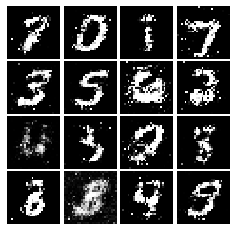

Epoch: 8, Iter: 3840, D: 1.355, G:0.8462


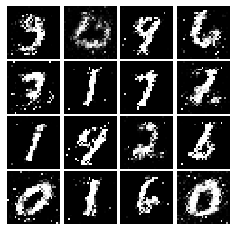

Epoch: 8, Iter: 3860, D: 1.33, G:0.7423


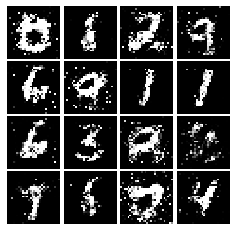

Epoch: 8, Iter: 3880, D: 1.396, G:0.8386


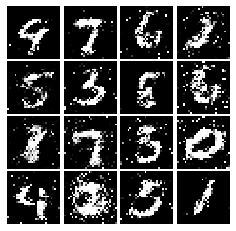

Epoch: 8, Iter: 3900, D: 1.357, G:0.8125


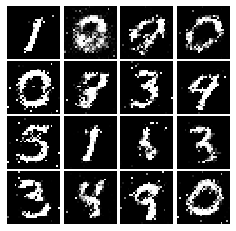

Epoch: 8, Iter: 3920, D: 1.33, G:0.7904


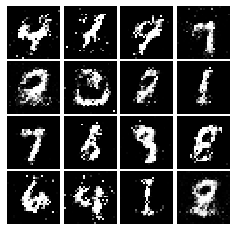

Epoch: 8, Iter: 3940, D: 1.343, G:0.7447


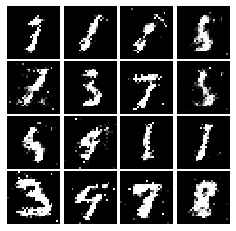

Epoch: 8, Iter: 3960, D: 1.358, G:0.7411


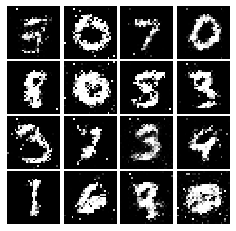

Epoch: 8, Iter: 3980, D: 1.355, G:0.7943


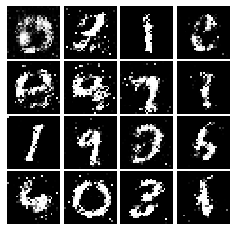

Epoch: 8, Iter: 4000, D: 1.361, G:0.7372


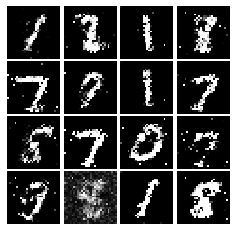

Epoch: 8, Iter: 4020, D: 1.395, G:0.7727


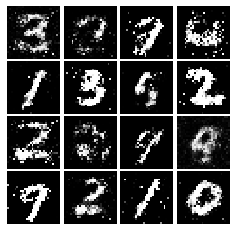

Epoch: 8, Iter: 4040, D: 1.313, G:0.7912


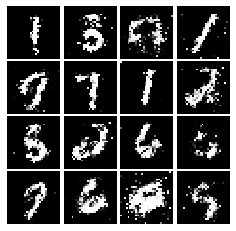

Epoch: 8, Iter: 4060, D: 1.314, G:0.7661


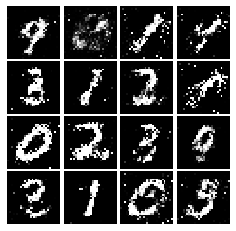

Epoch: 8, Iter: 4080, D: 1.372, G:0.8152


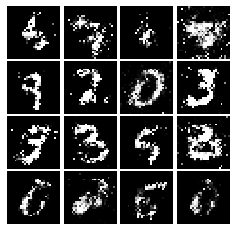

Epoch: 8, Iter: 4100, D: 1.384, G:0.7781


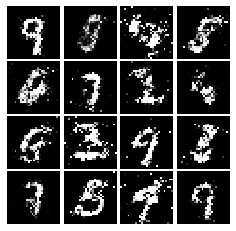

Epoch: 8, Iter: 4120, D: 1.45, G:0.7197


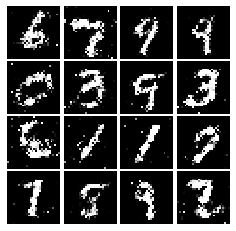

Epoch: 8, Iter: 4140, D: 1.285, G:0.7511


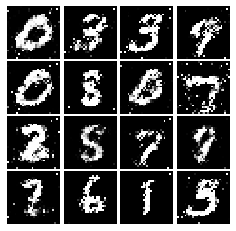

Epoch: 8, Iter: 4160, D: 1.394, G:0.7528


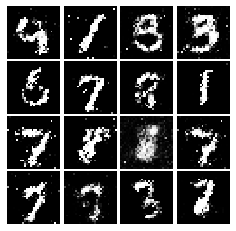

Epoch: 8, Iter: 4180, D: 1.366, G:0.8348


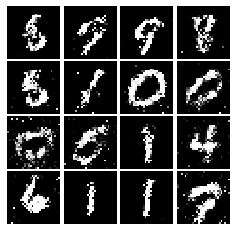

Epoch: 8, Iter: 4200, D: 1.333, G:0.8255


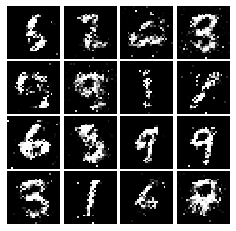

Epoch: 8, Iter: 4220, D: 1.314, G:0.905


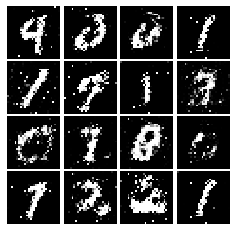

Epoch: 9, Iter: 4240, D: 1.386, G:0.778


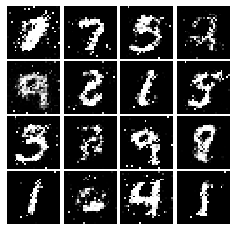

Epoch: 9, Iter: 4260, D: 1.38, G:0.8166


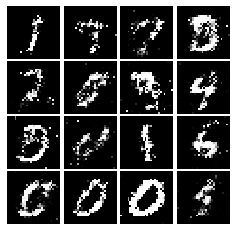

Epoch: 9, Iter: 4280, D: 1.41, G:0.8416


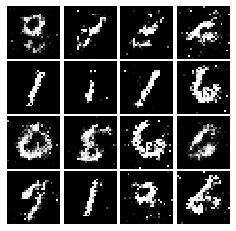

Epoch: 9, Iter: 4300, D: 1.449, G:0.8567


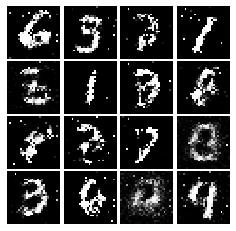

Epoch: 9, Iter: 4320, D: 1.425, G:0.6884


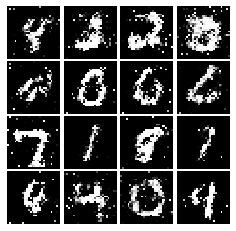

Epoch: 9, Iter: 4340, D: 1.356, G:0.7711


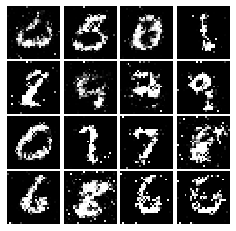

Epoch: 9, Iter: 4360, D: 1.415, G:0.7384


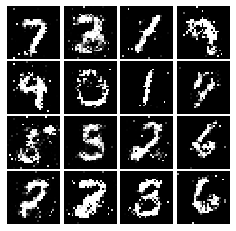

Epoch: 9, Iter: 4380, D: 1.384, G:0.8482


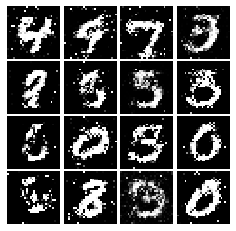

Epoch: 9, Iter: 4400, D: 1.266, G:0.7641


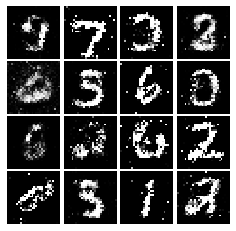

Epoch: 9, Iter: 4420, D: 1.309, G:0.6852


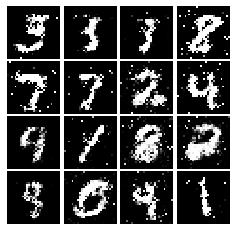

Epoch: 9, Iter: 4440, D: 1.345, G:0.8522


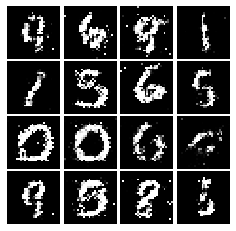

Epoch: 9, Iter: 4460, D: 1.354, G:0.7763


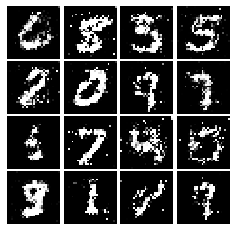

Epoch: 9, Iter: 4480, D: 1.337, G:0.8976


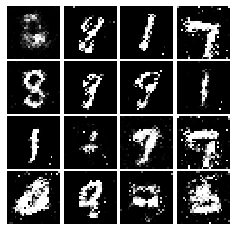

Epoch: 9, Iter: 4500, D: 1.44, G:0.8541


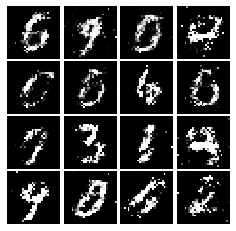

Epoch: 9, Iter: 4520, D: 1.39, G:0.9969


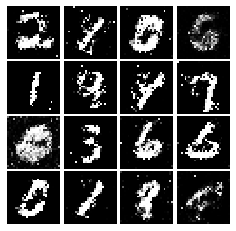

Epoch: 9, Iter: 4540, D: 1.346, G:0.7929


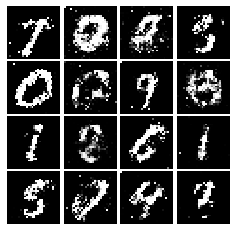

Epoch: 9, Iter: 4560, D: 1.333, G:0.7942


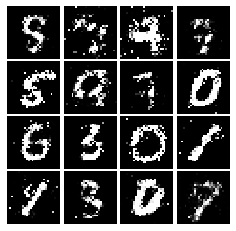

Epoch: 9, Iter: 4580, D: 1.3, G:1.26


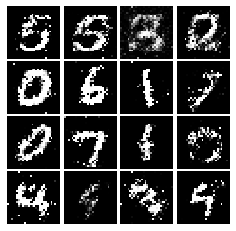

Epoch: 9, Iter: 4600, D: 1.331, G:0.7528


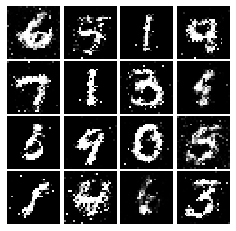

Epoch: 9, Iter: 4620, D: 1.309, G:0.7324


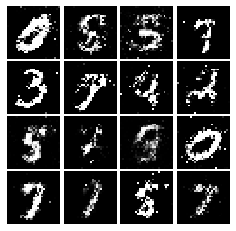

Epoch: 9, Iter: 4640, D: 1.348, G:0.8313


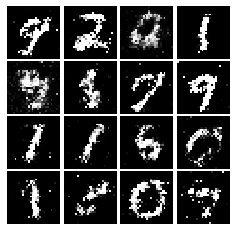

Epoch: 9, Iter: 4660, D: 1.283, G:0.7625


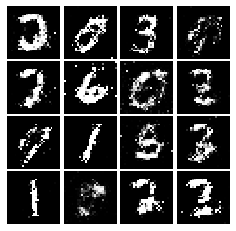

Epoch: 9, Iter: 4680, D: 1.318, G:0.7029


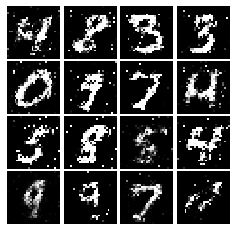

Final images


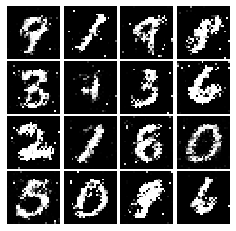

In [35]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [36]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    N, _ = scores_fake.shape
    loss = 0.5*tf.reduce_mean((scores_real-1)**2) + 0.5*tf.reduce_mean((scores_fake)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    N, _ = scores_fake.shape
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = tf.reduce_mean(0.5*((scores_fake-1)**2))
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [37]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1643, G:0.4206


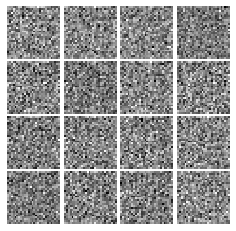

Epoch: 0, Iter: 20, D: 0.1177, G:1.778


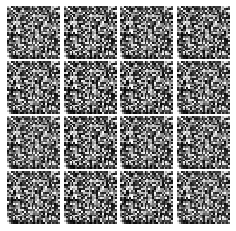

Epoch: 0, Iter: 40, D: 0.02353, G:0.8305


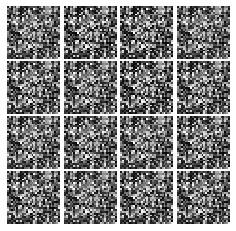

Epoch: 0, Iter: 60, D: 0.0329, G:0.6827


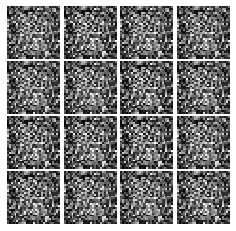

Epoch: 0, Iter: 80, D: 0.06996, G:0.7616


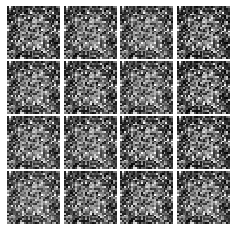

Epoch: 0, Iter: 100, D: 0.1054, G:0.4678


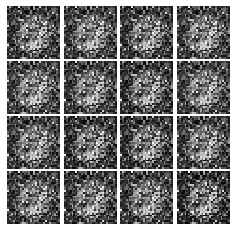

Epoch: 0, Iter: 120, D: 0.08574, G:0.4214


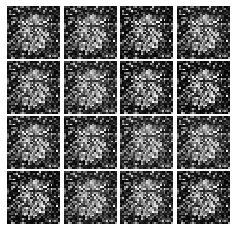

Epoch: 0, Iter: 140, D: 0.09126, G:0.6478


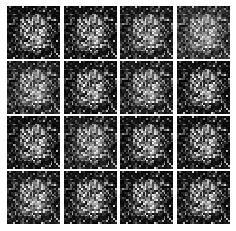

Epoch: 0, Iter: 160, D: 0.272, G:1.773


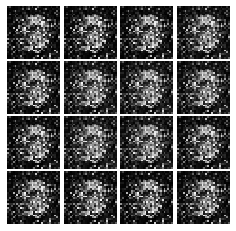

Epoch: 0, Iter: 180, D: 0.145, G:0.8747


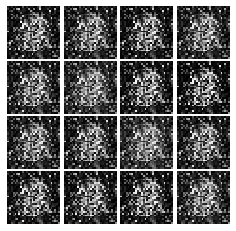

Epoch: 0, Iter: 200, D: 0.08147, G:0.4824


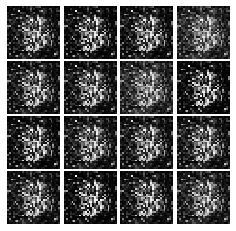

Epoch: 0, Iter: 220, D: 0.2078, G:0.5981


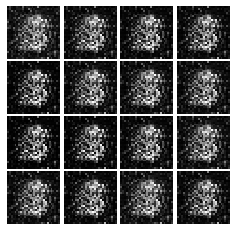

Epoch: 0, Iter: 240, D: 0.1109, G:0.7004


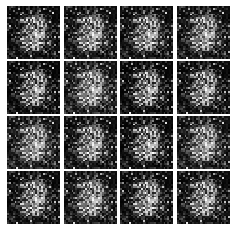

Epoch: 0, Iter: 260, D: 0.05767, G:0.4703


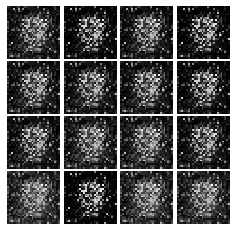

Epoch: 0, Iter: 280, D: 0.09863, G:0.337


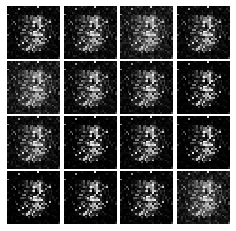

Epoch: 0, Iter: 300, D: 0.207, G:0.2552


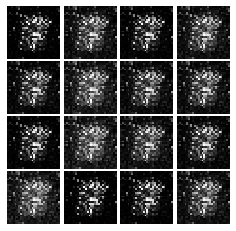

Epoch: 0, Iter: 320, D: 0.1261, G:0.3391


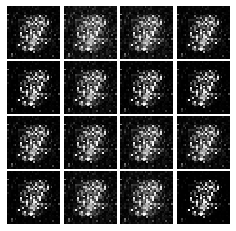

Epoch: 0, Iter: 340, D: 0.08114, G:0.607


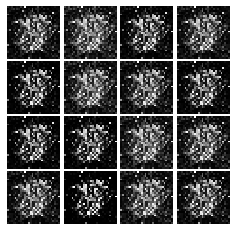

Epoch: 0, Iter: 360, D: 0.1536, G:0.4433


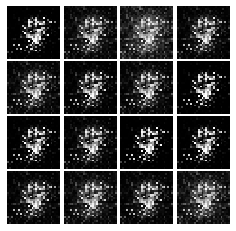

Epoch: 0, Iter: 380, D: 0.2111, G:0.4147


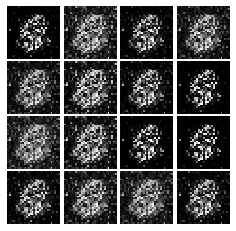

Epoch: 0, Iter: 400, D: 0.2021, G:0.695


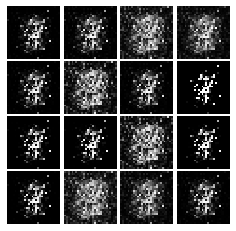

Epoch: 0, Iter: 420, D: 0.1046, G:0.3466


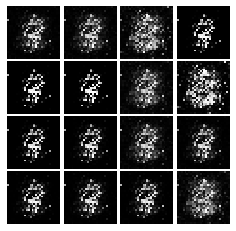

Epoch: 0, Iter: 440, D: 0.161, G:0.3652


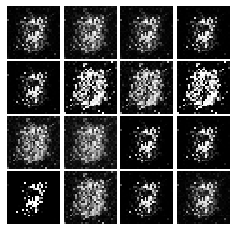

Epoch: 0, Iter: 460, D: 0.08473, G:0.3316


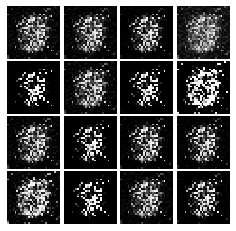

Epoch: 1, Iter: 480, D: 0.09605, G:0.305


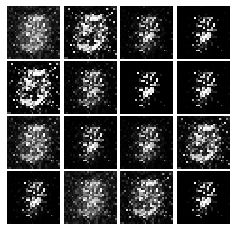

Epoch: 1, Iter: 500, D: 0.1731, G:0.4202


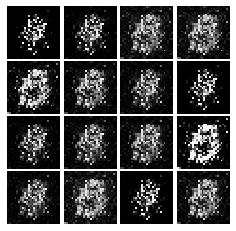

Epoch: 1, Iter: 520, D: 0.1162, G:0.4495


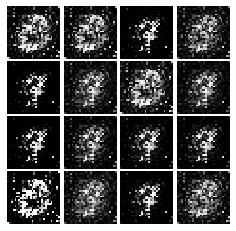

Epoch: 1, Iter: 540, D: 0.1163, G:0.4139


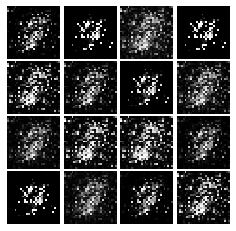

Epoch: 1, Iter: 560, D: 0.08928, G:0.3928


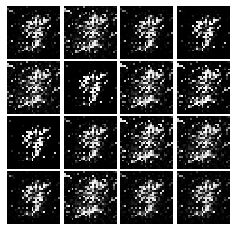

Epoch: 1, Iter: 580, D: 0.1162, G:0.7644


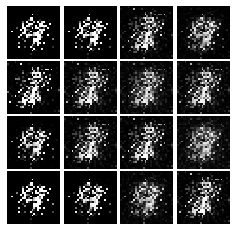

Epoch: 1, Iter: 600, D: 0.2526, G:0.1752


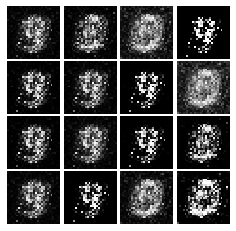

Epoch: 1, Iter: 620, D: 0.3872, G:1.078


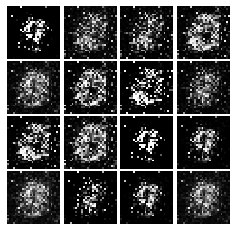

Epoch: 1, Iter: 640, D: 0.1963, G:0.3425


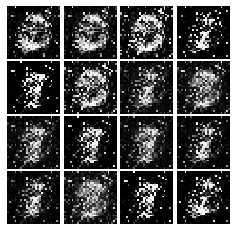

Epoch: 1, Iter: 660, D: 0.1323, G:0.2936


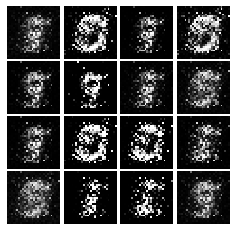

Epoch: 1, Iter: 680, D: 0.1349, G:0.2889


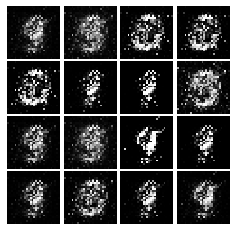

Epoch: 1, Iter: 700, D: 0.1409, G:0.2513


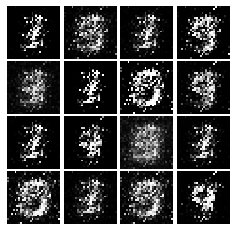

Epoch: 1, Iter: 720, D: 0.1365, G:0.2566


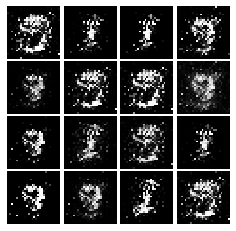

Epoch: 1, Iter: 740, D: 0.1081, G:0.517


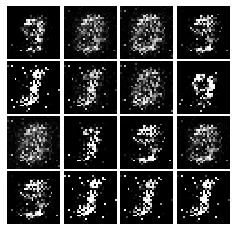

Epoch: 1, Iter: 760, D: 0.139, G:0.3174


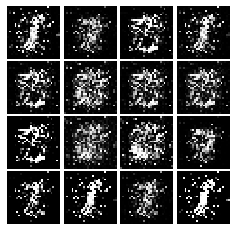

Epoch: 1, Iter: 780, D: 0.14, G:0.4719


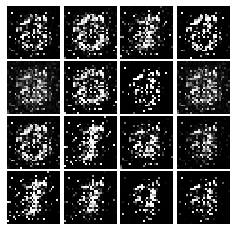

Epoch: 1, Iter: 800, D: 0.1349, G:0.3048


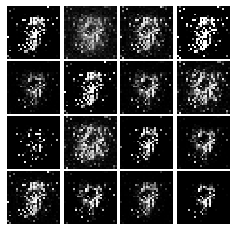

Epoch: 1, Iter: 820, D: 0.1189, G:0.4713


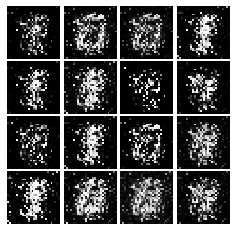

Epoch: 1, Iter: 840, D: 0.1616, G:0.8449


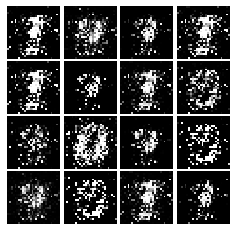

Epoch: 1, Iter: 860, D: 0.1243, G:0.7454


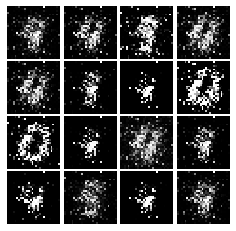

Epoch: 1, Iter: 880, D: 0.1071, G:0.3343


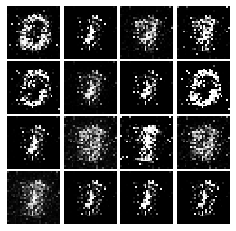

Epoch: 1, Iter: 900, D: 0.2162, G:0.4195


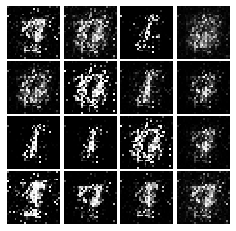

Epoch: 1, Iter: 920, D: 0.1505, G:0.3285


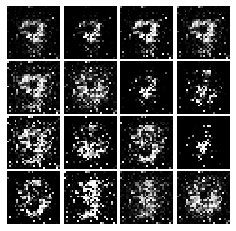

Epoch: 2, Iter: 940, D: 0.143, G:0.2594


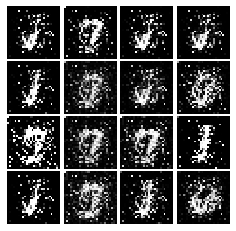

Epoch: 2, Iter: 960, D: 0.1603, G:0.1705


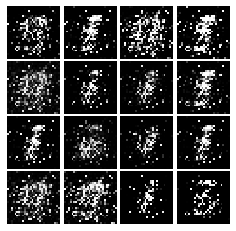

Epoch: 2, Iter: 980, D: 0.1772, G:0.3498


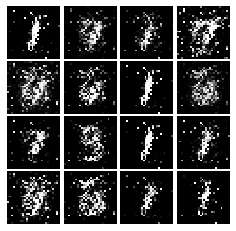

Epoch: 2, Iter: 1000, D: 0.1558, G:0.269


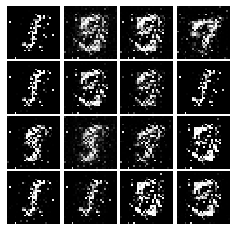

Epoch: 2, Iter: 1020, D: 0.4457, G:0.08446


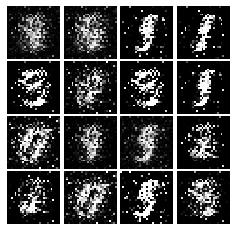

Epoch: 2, Iter: 1040, D: 0.1793, G:0.2597


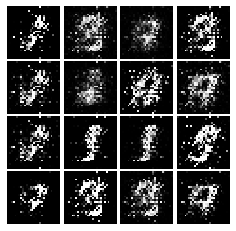

Epoch: 2, Iter: 1060, D: 0.1663, G:0.2912


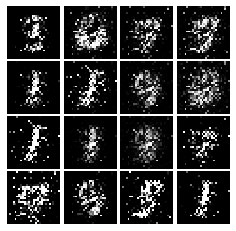

Epoch: 2, Iter: 1080, D: 0.1358, G:0.3002


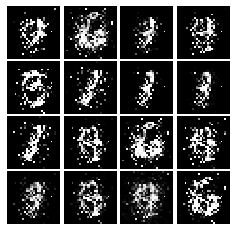

Epoch: 2, Iter: 1100, D: 0.1527, G:0.2983


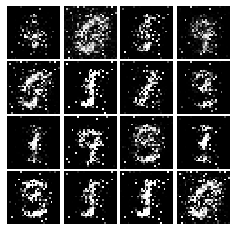

Epoch: 2, Iter: 1120, D: 0.1627, G:0.4323


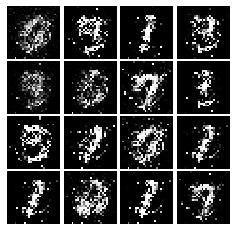

Epoch: 2, Iter: 1140, D: 0.1761, G:0.3817


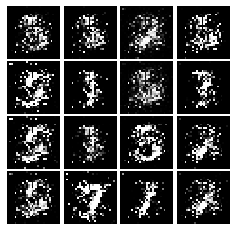

Epoch: 2, Iter: 1160, D: 0.1364, G:0.2893


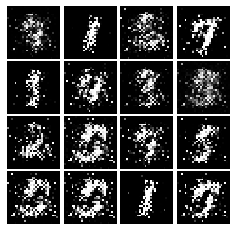

Epoch: 2, Iter: 1180, D: 0.1674, G:0.3164


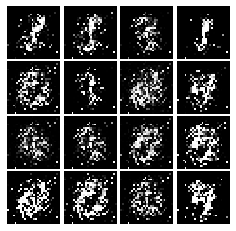

Epoch: 2, Iter: 1200, D: 0.2362, G:0.1948


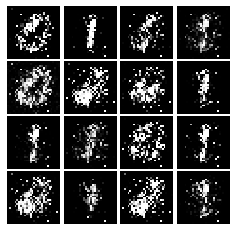

Epoch: 2, Iter: 1220, D: 0.1643, G:0.288


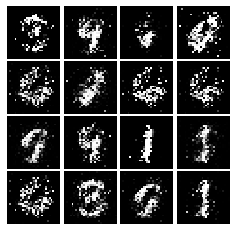

Epoch: 2, Iter: 1240, D: 0.2094, G:0.2735


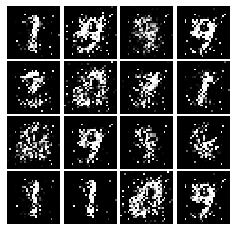

Epoch: 2, Iter: 1260, D: 0.1563, G:0.4012


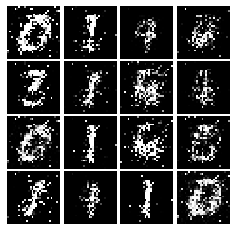

Epoch: 2, Iter: 1280, D: 0.1709, G:0.2774


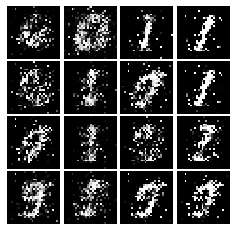

Epoch: 2, Iter: 1300, D: 0.1474, G:0.4525


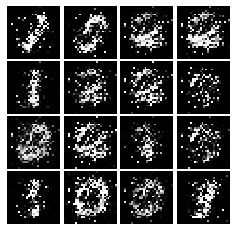

Epoch: 2, Iter: 1320, D: 0.1841, G:0.2368


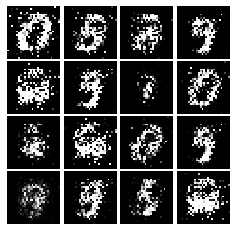

Epoch: 2, Iter: 1340, D: 0.1652, G:0.2958


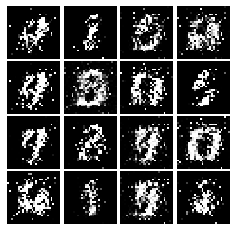

Epoch: 2, Iter: 1360, D: 0.181, G:0.3828


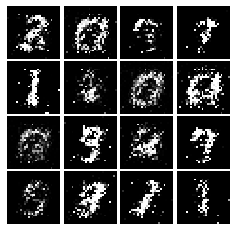

Epoch: 2, Iter: 1380, D: 0.1356, G:0.311


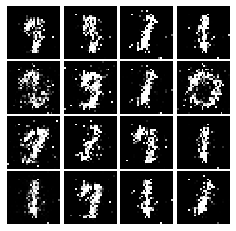

Epoch: 2, Iter: 1400, D: 0.3037, G:0.06896


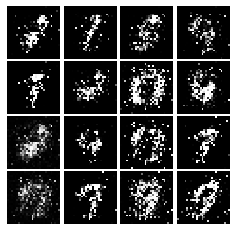

Epoch: 3, Iter: 1420, D: 0.1872, G:0.2591


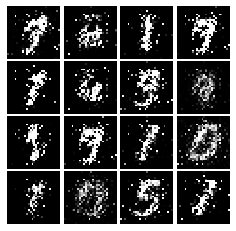

Epoch: 3, Iter: 1440, D: 0.1707, G:0.335


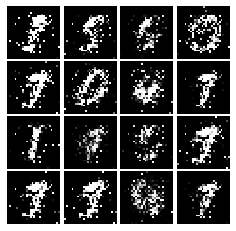

Epoch: 3, Iter: 1460, D: 0.2152, G:0.1476


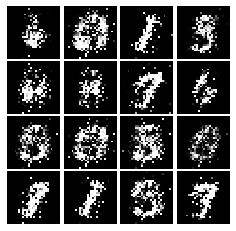

Epoch: 3, Iter: 1480, D: 0.1881, G:0.2576


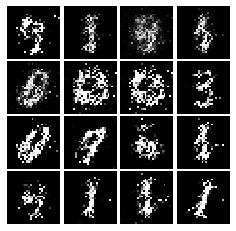

Epoch: 3, Iter: 1500, D: 0.1583, G:0.4668


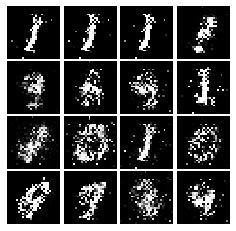

Epoch: 3, Iter: 1520, D: 0.2008, G:0.2883


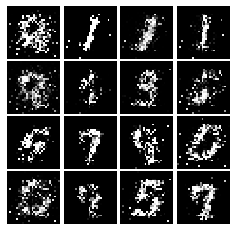

Epoch: 3, Iter: 1540, D: 0.5868, G:0.05365


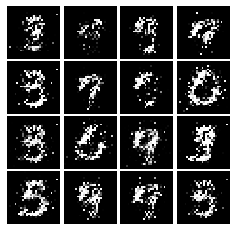

Epoch: 3, Iter: 1560, D: 0.2213, G:0.172


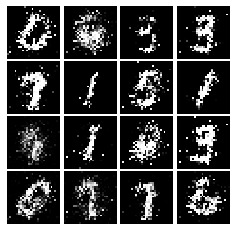

Epoch: 3, Iter: 1580, D: 0.2176, G:0.2556


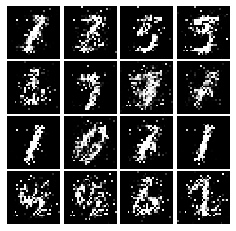

Epoch: 3, Iter: 1600, D: 0.1613, G:0.4038


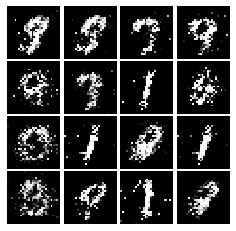

Epoch: 3, Iter: 1620, D: 0.1653, G:0.1708


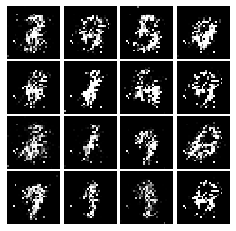

Epoch: 3, Iter: 1640, D: 0.4244, G:0.348


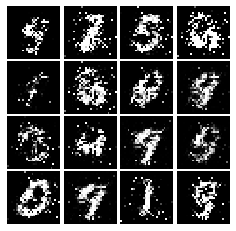

Epoch: 3, Iter: 1660, D: 0.1463, G:0.2528


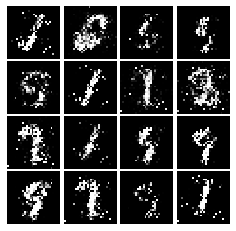

Epoch: 3, Iter: 1680, D: 0.1865, G:0.2833


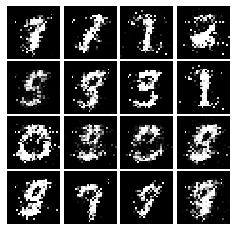

Epoch: 3, Iter: 1700, D: 0.2367, G:0.1717


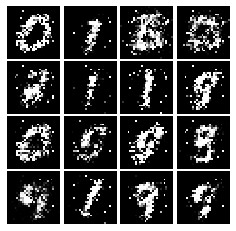

Epoch: 3, Iter: 1720, D: 0.2333, G:0.1905


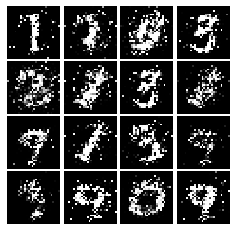

Epoch: 3, Iter: 1740, D: 0.2169, G:0.1797


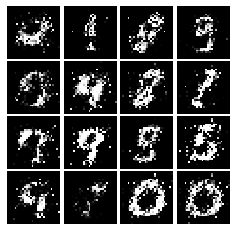

Epoch: 3, Iter: 1760, D: 0.1681, G:0.2566


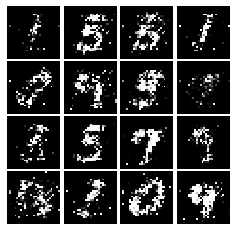

Epoch: 3, Iter: 1780, D: 0.1826, G:0.2544


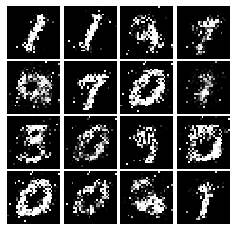

Epoch: 3, Iter: 1800, D: 0.1965, G:0.193


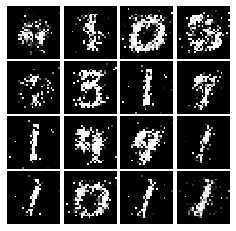

Epoch: 3, Iter: 1820, D: 0.2399, G:0.1668


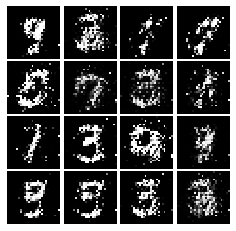

Epoch: 3, Iter: 1840, D: 0.1932, G:0.1696


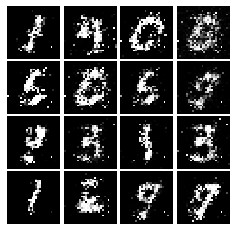

Epoch: 3, Iter: 1860, D: 0.1863, G:0.2666


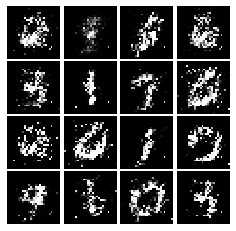

Epoch: 4, Iter: 1880, D: 0.2101, G:0.2547


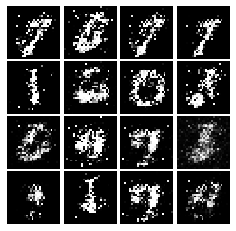

Epoch: 4, Iter: 1900, D: 0.2481, G:0.247


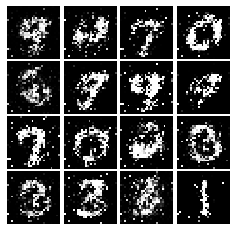

Epoch: 4, Iter: 1920, D: 0.2373, G:0.1896


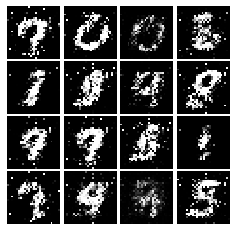

Epoch: 4, Iter: 1940, D: 0.2581, G:0.164


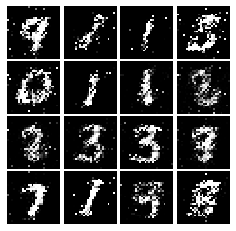

Epoch: 4, Iter: 1960, D: 0.2082, G:0.1988


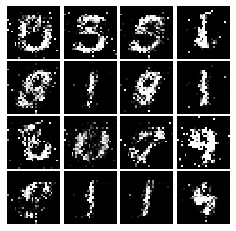

Epoch: 4, Iter: 1980, D: 0.2033, G:0.2099


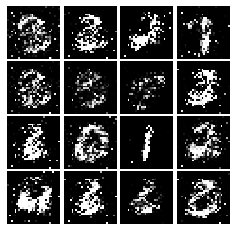

Epoch: 4, Iter: 2000, D: 0.2309, G:0.1847


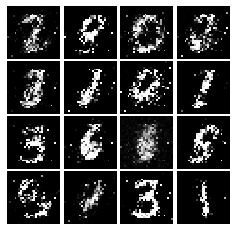

Epoch: 4, Iter: 2020, D: 0.2348, G:0.171


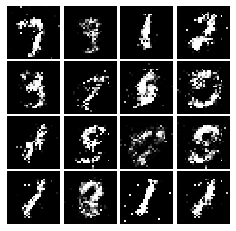

Epoch: 4, Iter: 2040, D: 0.2353, G:0.1744


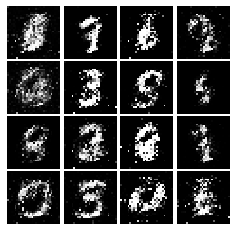

Epoch: 4, Iter: 2060, D: 0.2258, G:0.1867


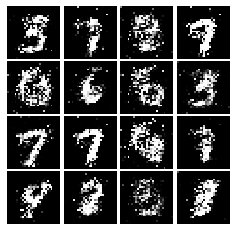

Epoch: 4, Iter: 2080, D: 0.2101, G:0.2012


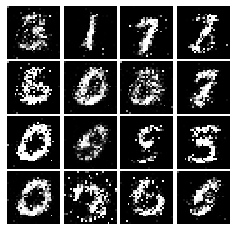

Epoch: 4, Iter: 2100, D: 0.2048, G:0.196


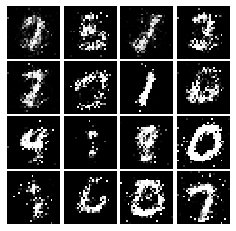

Epoch: 4, Iter: 2120, D: 0.2388, G:0.1758


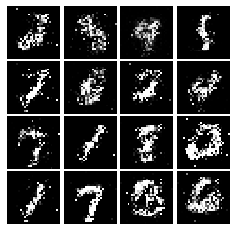

Epoch: 4, Iter: 2140, D: 0.2344, G:0.1803


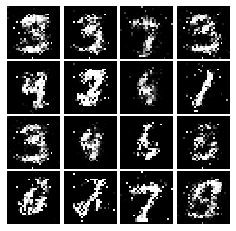

Epoch: 4, Iter: 2160, D: 0.2201, G:0.1742


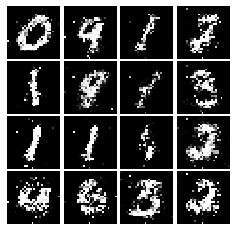

Epoch: 4, Iter: 2180, D: 0.2014, G:0.185


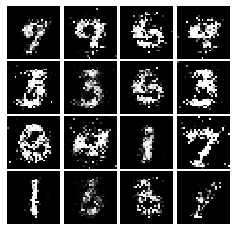

Epoch: 4, Iter: 2200, D: 0.2023, G:0.2033


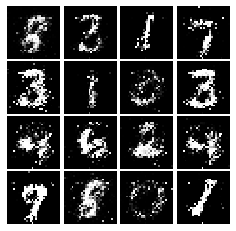

Epoch: 4, Iter: 2220, D: 0.23, G:0.1655


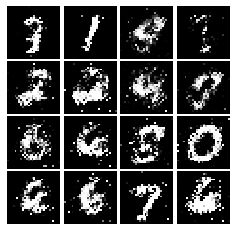

Epoch: 4, Iter: 2240, D: 0.229, G:0.1715


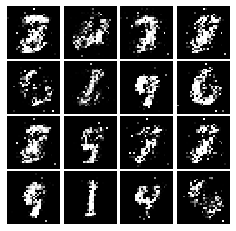

Epoch: 4, Iter: 2260, D: 0.2474, G:0.1788


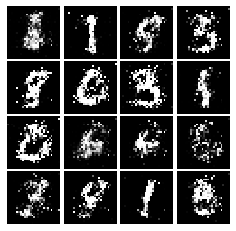

Epoch: 4, Iter: 2280, D: 0.2158, G:0.209


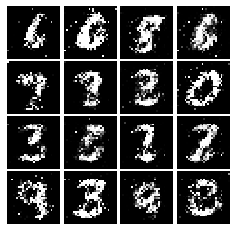

Epoch: 4, Iter: 2300, D: 0.2163, G:0.1987


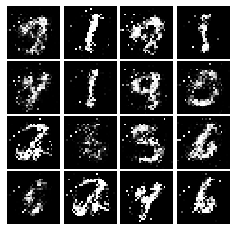

Epoch: 4, Iter: 2320, D: 0.2091, G:0.2078


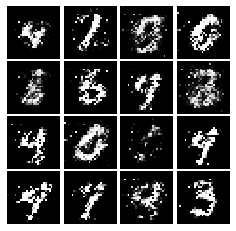

Epoch: 4, Iter: 2340, D: 0.204, G:0.2072


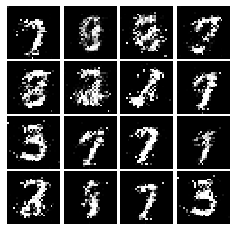

Epoch: 5, Iter: 2360, D: 0.2214, G:0.1969


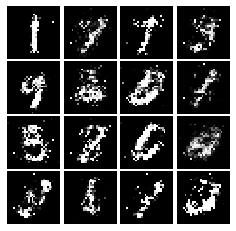

Epoch: 5, Iter: 2380, D: 0.2354, G:0.1681


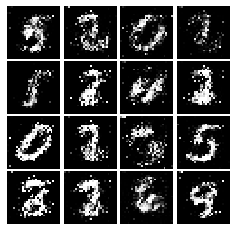

Epoch: 5, Iter: 2400, D: 0.2302, G:0.1852


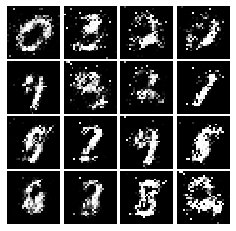

Epoch: 5, Iter: 2420, D: 0.2226, G:0.1841


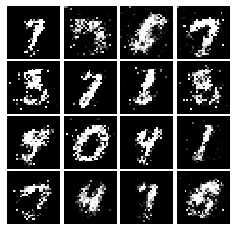

Epoch: 5, Iter: 2440, D: 0.2063, G:0.2077


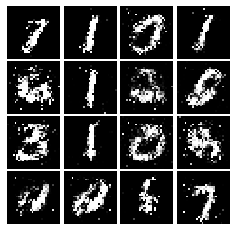

Epoch: 5, Iter: 2460, D: 0.2095, G:0.2168


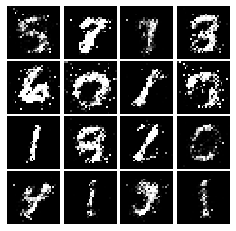

Epoch: 5, Iter: 2480, D: 0.2214, G:0.1834


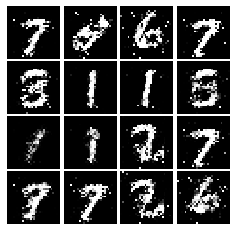

Epoch: 5, Iter: 2500, D: 0.2023, G:0.2191


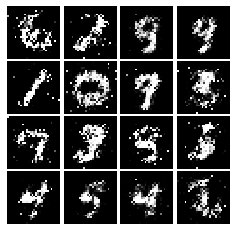

Epoch: 5, Iter: 2520, D: 0.291, G:0.1765


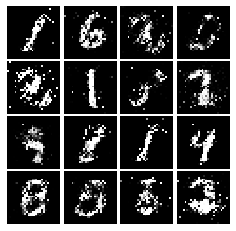

Epoch: 5, Iter: 2540, D: 0.2217, G:0.1504


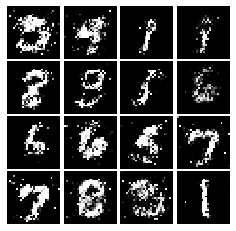

Epoch: 5, Iter: 2560, D: 0.2222, G:0.2127


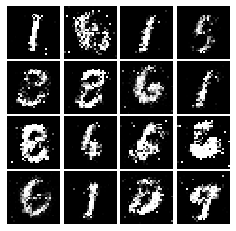

Epoch: 5, Iter: 2580, D: 0.2241, G:0.2021


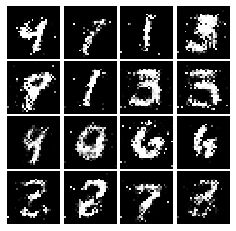

Epoch: 5, Iter: 2600, D: 0.2819, G:0.1156


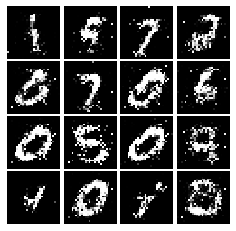

Epoch: 5, Iter: 2620, D: 0.2078, G:0.1648


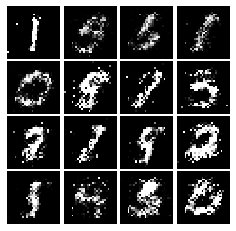

Epoch: 5, Iter: 2640, D: 0.2181, G:0.1974


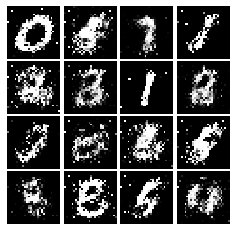

Epoch: 5, Iter: 2660, D: 0.2285, G:0.1924


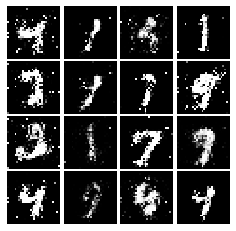

Epoch: 5, Iter: 2680, D: 0.2381, G:0.1655


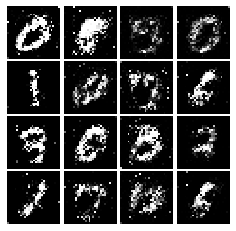

Epoch: 5, Iter: 2700, D: 0.2432, G:0.176


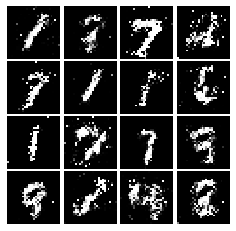

Epoch: 5, Iter: 2720, D: 0.2217, G:0.1722


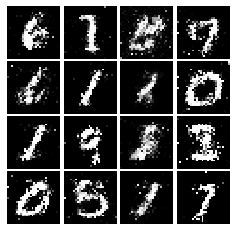

Epoch: 5, Iter: 2740, D: 0.2519, G:0.1629


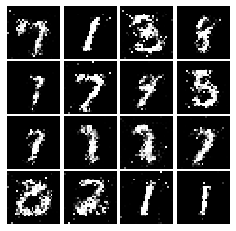

Epoch: 5, Iter: 2760, D: 0.2327, G:0.1677


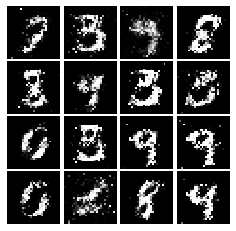

Epoch: 5, Iter: 2780, D: 0.2166, G:0.1755


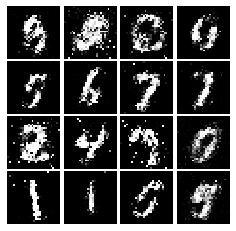

Epoch: 5, Iter: 2800, D: 0.1874, G:0.1876


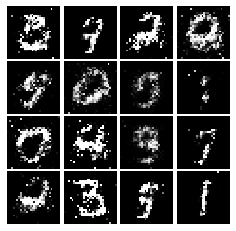

Epoch: 6, Iter: 2820, D: 0.2348, G:0.1666


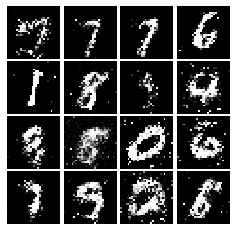

Epoch: 6, Iter: 2840, D: 0.2427, G:0.1638


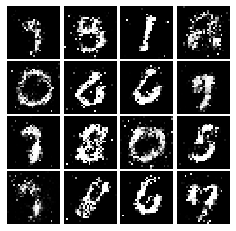

Epoch: 6, Iter: 2860, D: 0.2088, G:0.1819


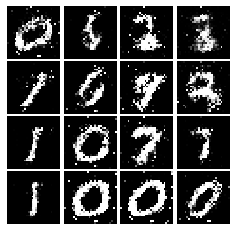

Epoch: 6, Iter: 2880, D: 0.206, G:0.2207


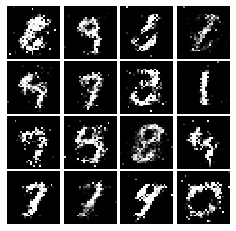

Epoch: 6, Iter: 2900, D: 0.2429, G:0.1733


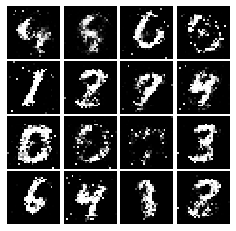

Epoch: 6, Iter: 2920, D: 0.2389, G:0.1521


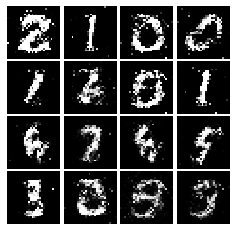

Epoch: 6, Iter: 2940, D: 0.2161, G:0.1692


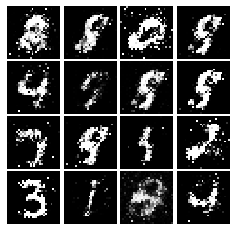

Epoch: 6, Iter: 2960, D: 0.2297, G:0.1997


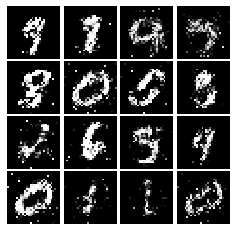

Epoch: 6, Iter: 2980, D: 0.2548, G:0.1692


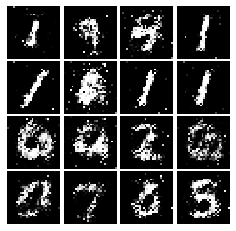

Epoch: 6, Iter: 3000, D: 0.2139, G:0.1671


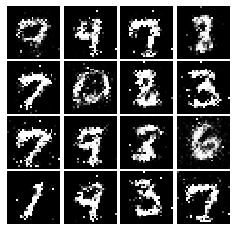

Epoch: 6, Iter: 3020, D: 0.2124, G:0.1795


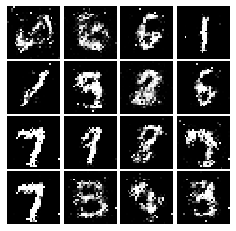

Epoch: 6, Iter: 3040, D: 0.2245, G:0.1948


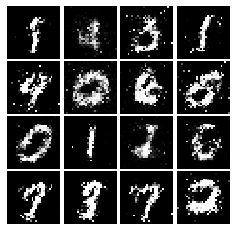

Epoch: 6, Iter: 3060, D: 0.2243, G:0.1631


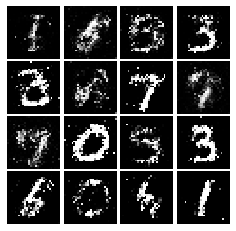

Epoch: 6, Iter: 3080, D: 0.2183, G:0.173


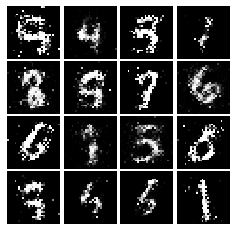

Epoch: 6, Iter: 3100, D: 0.2142, G:0.1437


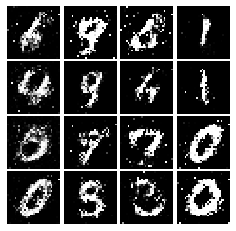

Epoch: 6, Iter: 3120, D: 0.2143, G:0.1741


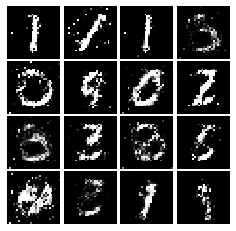

Epoch: 6, Iter: 3140, D: 0.2408, G:0.1866


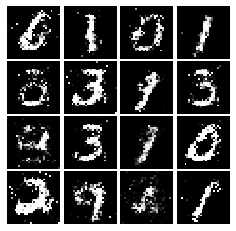

Epoch: 6, Iter: 3160, D: 0.2306, G:0.1791


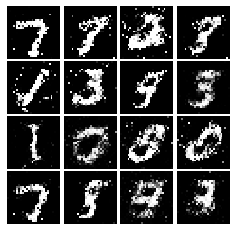

Epoch: 6, Iter: 3180, D: 0.2303, G:0.1985


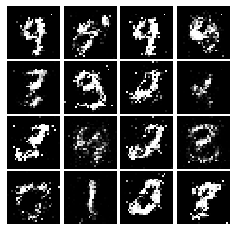

Epoch: 6, Iter: 3200, D: 0.2203, G:0.1914


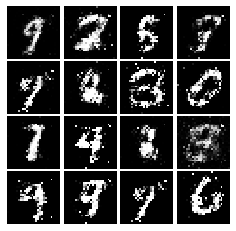

Epoch: 6, Iter: 3220, D: 0.2109, G:0.1636


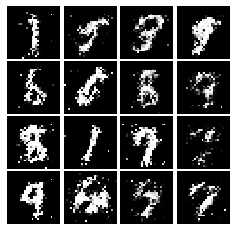

Epoch: 6, Iter: 3240, D: 0.21, G:0.1508


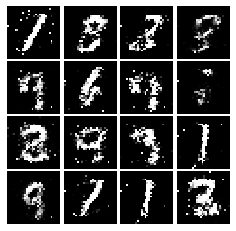

Epoch: 6, Iter: 3260, D: 0.2298, G:0.1519


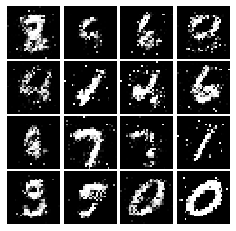

Epoch: 6, Iter: 3280, D: 0.2244, G:0.159


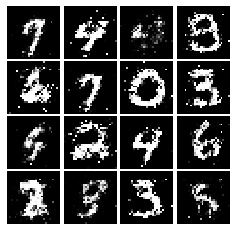

Epoch: 7, Iter: 3300, D: 0.2077, G:0.178


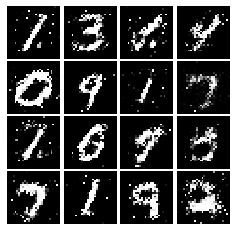

Epoch: 7, Iter: 3320, D: 0.2212, G:0.1976


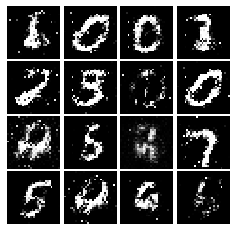

Epoch: 7, Iter: 3340, D: 0.2008, G:0.2128


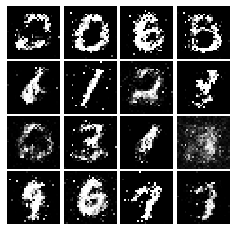

Epoch: 7, Iter: 3360, D: 0.2231, G:0.1537


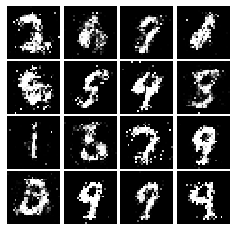

Epoch: 7, Iter: 3380, D: 0.2062, G:0.1867


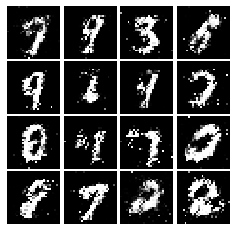

Epoch: 7, Iter: 3400, D: 0.2394, G:0.1545


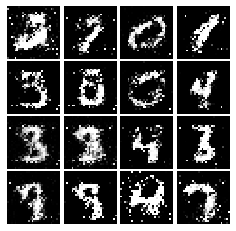

Epoch: 7, Iter: 3420, D: 0.2316, G:0.2021


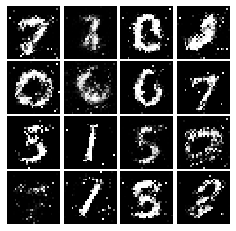

Epoch: 7, Iter: 3440, D: 0.2526, G:0.1736


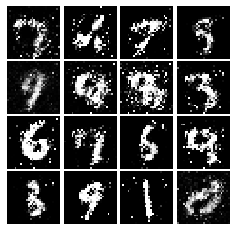

Epoch: 7, Iter: 3460, D: 0.1995, G:0.1692


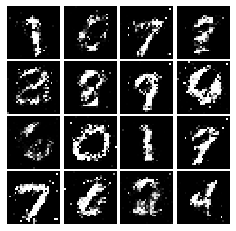

Epoch: 7, Iter: 3480, D: 0.2147, G:0.1667


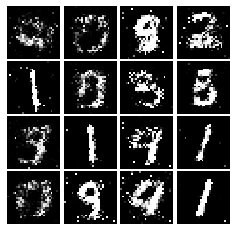

Epoch: 7, Iter: 3500, D: 0.2336, G:0.1504


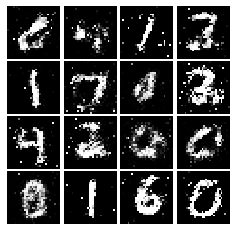

Epoch: 7, Iter: 3520, D: 0.2361, G:0.2103


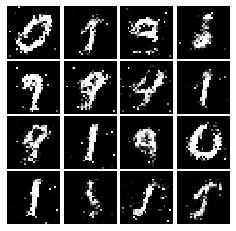

Epoch: 7, Iter: 3540, D: 0.2245, G:0.1607


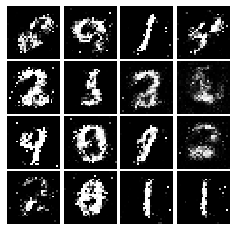

Epoch: 7, Iter: 3560, D: 0.2058, G:0.1729


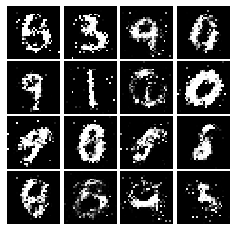

Epoch: 7, Iter: 3580, D: 0.215, G:0.1786


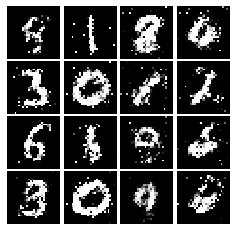

Epoch: 7, Iter: 3600, D: 0.2401, G:0.1459


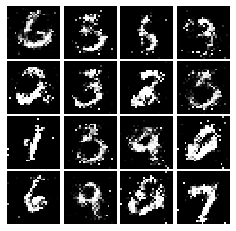

Epoch: 7, Iter: 3620, D: 0.2178, G:0.1815


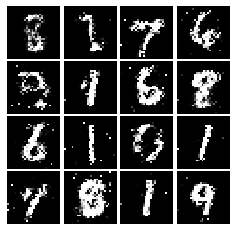

Epoch: 7, Iter: 3640, D: 0.238, G:0.1637


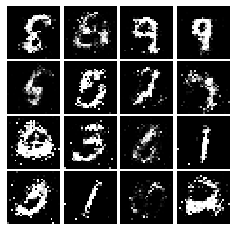

Epoch: 7, Iter: 3660, D: 0.229, G:0.175


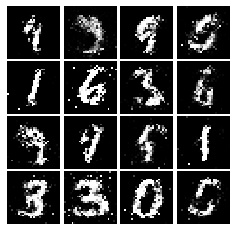

Epoch: 7, Iter: 3680, D: 0.234, G:0.1714


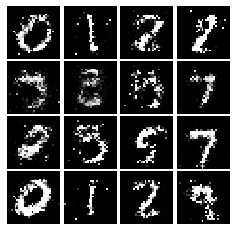

Epoch: 7, Iter: 3700, D: 0.2443, G:0.1826


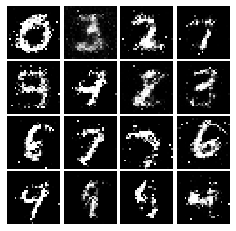

Epoch: 7, Iter: 3720, D: 0.2527, G:0.1743


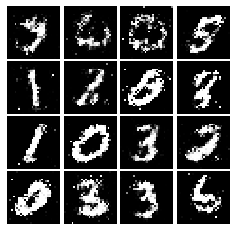

Epoch: 7, Iter: 3740, D: 0.2437, G:0.1629


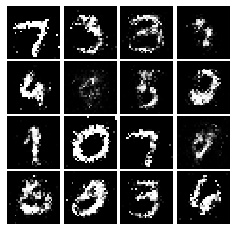

Epoch: 8, Iter: 3760, D: 0.2355, G:0.1851


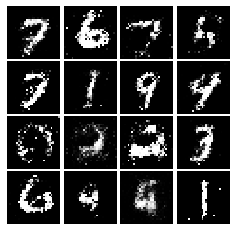

Epoch: 8, Iter: 3780, D: 0.2429, G:0.1457


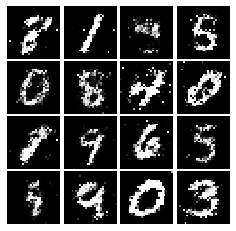

Epoch: 8, Iter: 3800, D: 0.221, G:0.1441


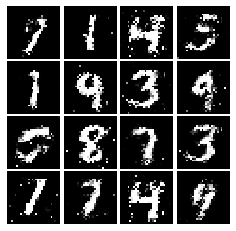

Epoch: 8, Iter: 3820, D: 0.2389, G:0.1759


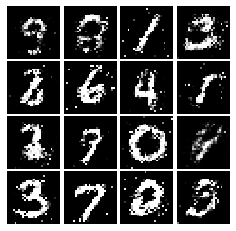

Epoch: 8, Iter: 3840, D: 0.2344, G:0.1579


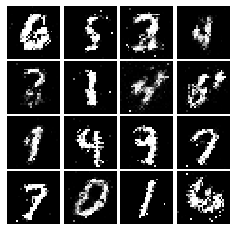

Epoch: 8, Iter: 3860, D: 0.2621, G:0.1877


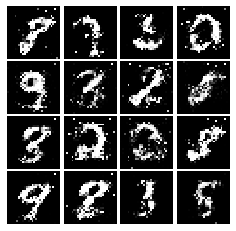

Epoch: 8, Iter: 3880, D: 0.2276, G:0.175


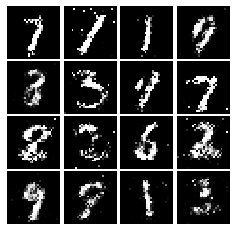

Epoch: 8, Iter: 3900, D: 0.2237, G:0.1679


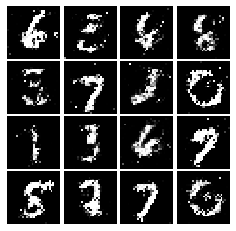

Epoch: 8, Iter: 3920, D: 0.2056, G:0.1943


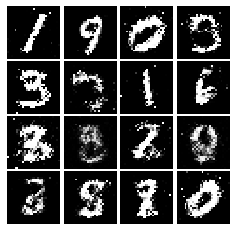

Epoch: 8, Iter: 3940, D: 0.2425, G:0.1491


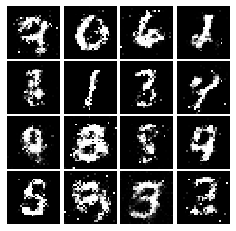

Epoch: 8, Iter: 3960, D: 0.2374, G:0.1675


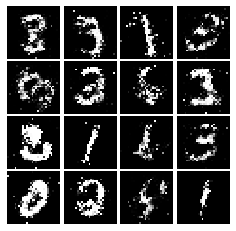

Epoch: 8, Iter: 3980, D: 0.2347, G:0.1897


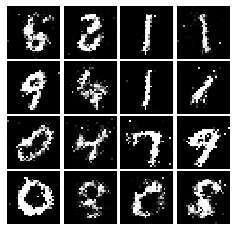

Epoch: 8, Iter: 4000, D: 0.2246, G:0.1666


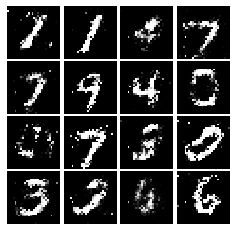

Epoch: 8, Iter: 4020, D: 0.2378, G:0.1745


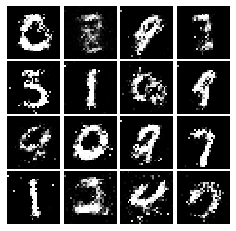

Epoch: 8, Iter: 4040, D: 0.229, G:0.1767


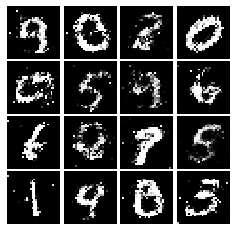

Epoch: 8, Iter: 4060, D: 0.2379, G:0.1526


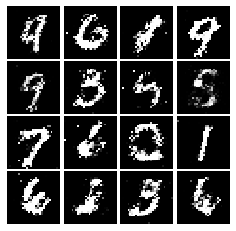

Epoch: 8, Iter: 4080, D: 0.2315, G:0.1662


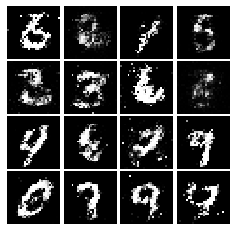

Epoch: 8, Iter: 4100, D: 0.2194, G:0.163


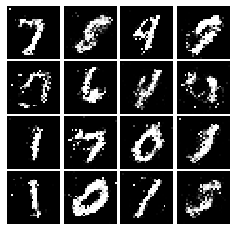

Epoch: 8, Iter: 4120, D: 0.2278, G:0.1617


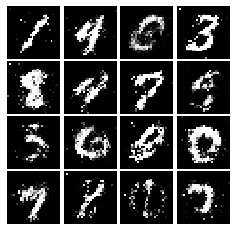

Epoch: 8, Iter: 4140, D: 0.2201, G:0.1782


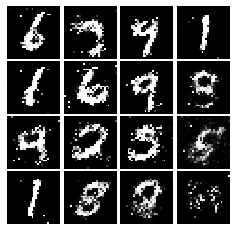

Epoch: 8, Iter: 4160, D: 0.2348, G:0.1786


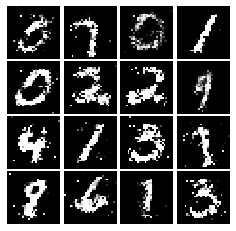

Epoch: 8, Iter: 4180, D: 0.2337, G:0.1484


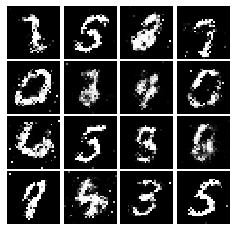

Epoch: 8, Iter: 4200, D: 0.2167, G:0.1677


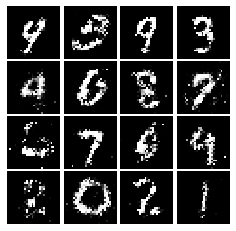

Epoch: 8, Iter: 4220, D: 0.2475, G:0.1601


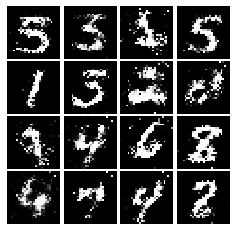

Epoch: 9, Iter: 4240, D: 0.2527, G:0.1641


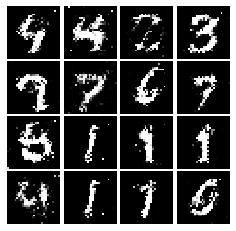

Epoch: 9, Iter: 4260, D: 0.2297, G:0.1746


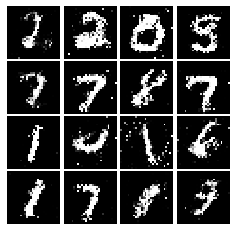

Epoch: 9, Iter: 4280, D: 0.2142, G:0.1739


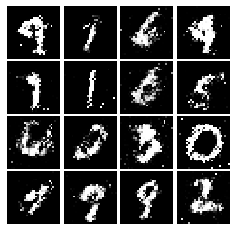

Epoch: 9, Iter: 4300, D: 0.2192, G:0.1472


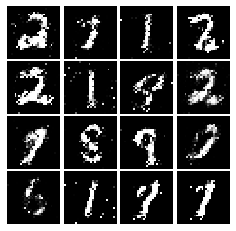

Epoch: 9, Iter: 4320, D: 0.2378, G:0.1868


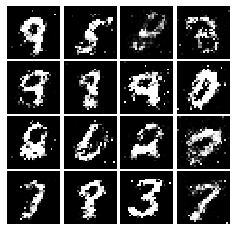

Epoch: 9, Iter: 4340, D: 0.213, G:0.1614


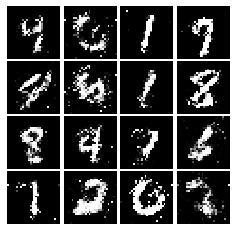

Epoch: 9, Iter: 4360, D: 0.2408, G:0.1546


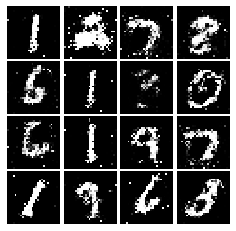

Epoch: 9, Iter: 4380, D: 0.2458, G:0.1619


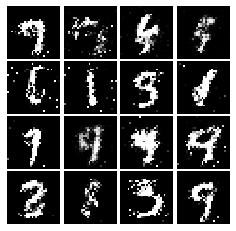

Epoch: 9, Iter: 4400, D: 0.2169, G:0.2032


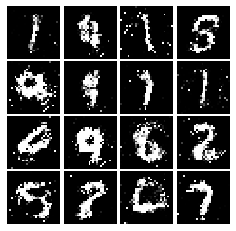

Epoch: 9, Iter: 4420, D: 0.2366, G:0.1604


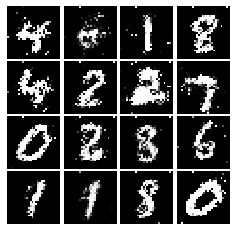

Epoch: 9, Iter: 4440, D: 0.2285, G:0.145


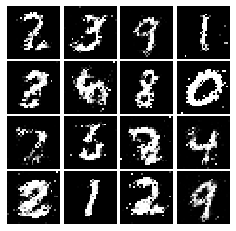

Epoch: 9, Iter: 4460, D: 0.2285, G:0.1799


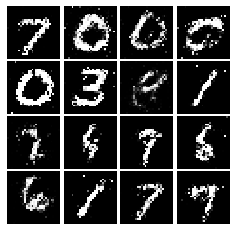

Epoch: 9, Iter: 4480, D: 0.237, G:0.1488


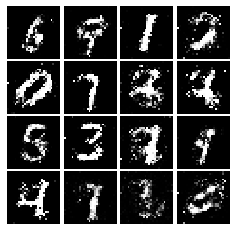

Epoch: 9, Iter: 4500, D: 0.2734, G:0.166


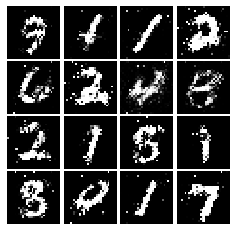

Epoch: 9, Iter: 4520, D: 0.234, G:0.1746


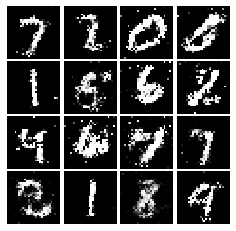

Epoch: 9, Iter: 4540, D: 0.242, G:0.1574


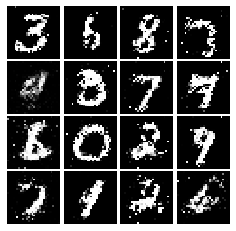

Epoch: 9, Iter: 4560, D: 0.2247, G:0.1672


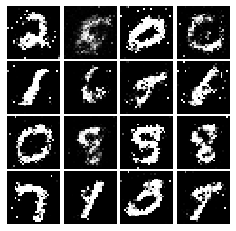

Epoch: 9, Iter: 4580, D: 0.2369, G:0.1747


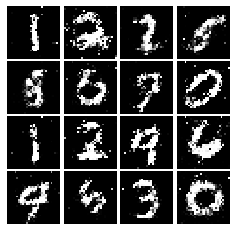

Epoch: 9, Iter: 4600, D: 0.2356, G:0.1695


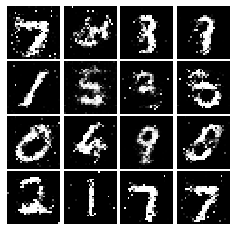

Epoch: 9, Iter: 4620, D: 0.2416, G:0.1989


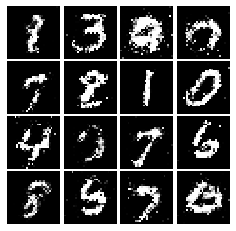

Epoch: 9, Iter: 4640, D: 0.2235, G:0.1487


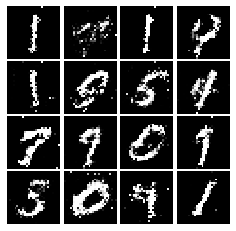

Epoch: 9, Iter: 4660, D: 0.2724, G:0.1574


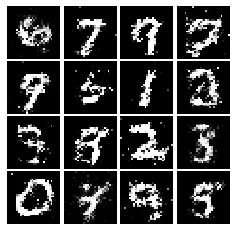

Epoch: 9, Iter: 4680, D: 0.2327, G:0.1806


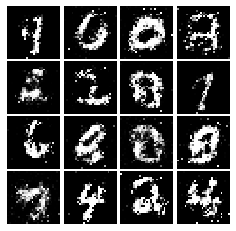

Final images


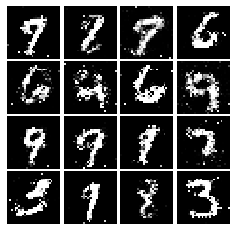

In [38]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [52]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    
#     model = tf.keras.models.Sequential([
#         # TODO: implement architecture
#         # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        
#         tf.keras.layers.InputLayer((784,)),
#         tf.keras.layers.Reshape((28,28,1)),
#         tf.keras.layers.Conv2D(filters=32,kernel_size=[5,5],strides=1,padding='valid',input_shape=(28,28,1)),
#         tf.keras.layers.LeakyReLU(0.01),
#         tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
#         tf.keras.layers.Conv2D(filters=64, kernel_size=(5, 5), strides=1, padding='valid'),
#         tf.keras.layers.LeakyReLU(0.01),
#         tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
#         tf.keras.layers.Flatten(),
#         tf.keras.layers.Dense(4*4*64),
#         tf.keras.layers.LeakyReLU(0.01),
#         tf.keras.layers.Dense(1)
        
#         # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
#     ])
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.InputLayer((784,)),
    tf.keras.layers.Reshape((28,28,1)),
    tf.keras.layers.Conv2D(filters=32,kernel_size=[5,5],strides=1,padding='valid',input_shape=(28,28,1)),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
    tf.keras.layers.Conv2D(filters=64,kernel_size=[5,5],strides=1,padding='valid'),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4*4*64),
    tf.keras.layers.LeakyReLU(alpha=0.01),        
    tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [55]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """

    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    
    model.add(tf.keras.layers.Dense(1024,activation='relu',input_shape=(noise_dim,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(7*7*128,activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7,7,128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=[4,4],strides=2,padding='same',activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=[4,4],strides=2,padding='same',activation='tanh'))
    
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
   
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.449, G:0.6592


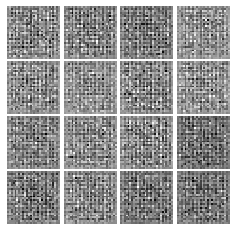

Epoch: 0, Iter: 20, D: 1.213, G:2.9


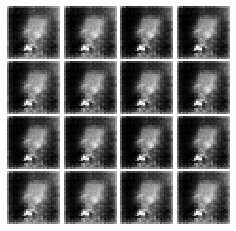

Epoch: 0, Iter: 40, D: 0.4849, G:2.555


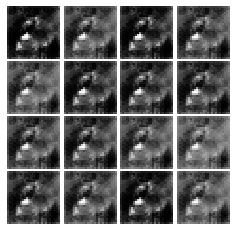

Epoch: 0, Iter: 60, D: 0.2555, G:2.603


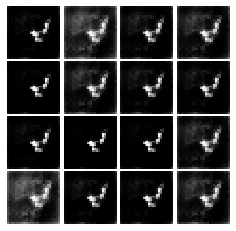

Epoch: 0, Iter: 80, D: 0.7739, G:1.599


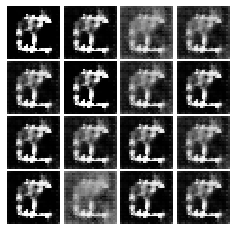

Epoch: 0, Iter: 100, D: 0.5187, G:2.312


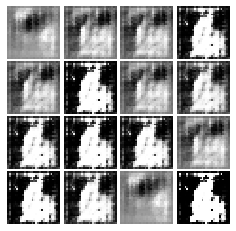

Epoch: 0, Iter: 120, D: 0.3264, G:2.599


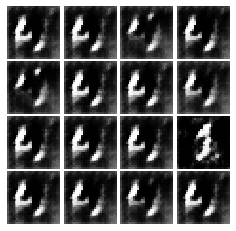

Epoch: 0, Iter: 140, D: 0.2676, G:2.374


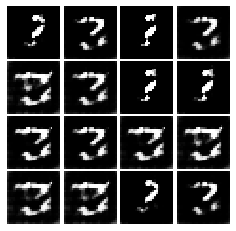

Epoch: 0, Iter: 160, D: 0.7671, G:3.349


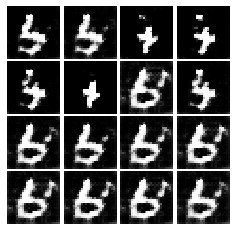

Epoch: 0, Iter: 180, D: 0.4437, G:5.08


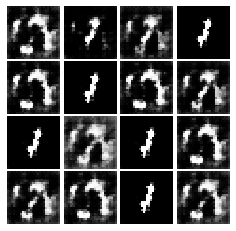

Epoch: 0, Iter: 200, D: 0.2124, G:3.371


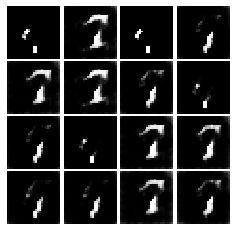

Epoch: 0, Iter: 220, D: 0.6033, G:2.788


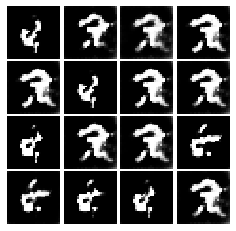

Epoch: 0, Iter: 240, D: 0.1931, G:4.051


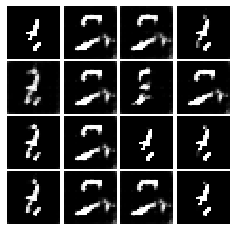

Epoch: 0, Iter: 260, D: 1.332, G:3.097


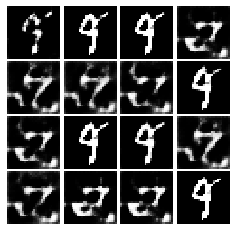

Epoch: 0, Iter: 280, D: 1.274, G:1.435


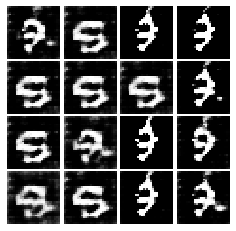

Epoch: 0, Iter: 300, D: 0.2728, G:3.152


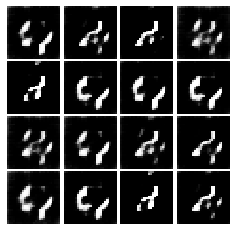

Epoch: 0, Iter: 320, D: 0.6904, G:2.114


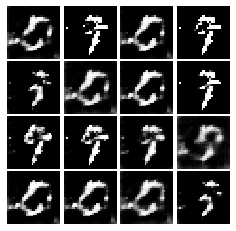

Epoch: 0, Iter: 340, D: 0.5428, G:2.108


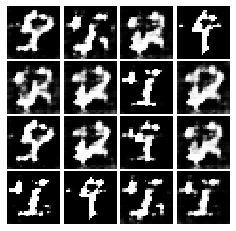

Epoch: 0, Iter: 360, D: 0.5772, G:2.126


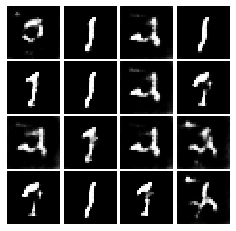

Epoch: 0, Iter: 380, D: 0.5873, G:3.839


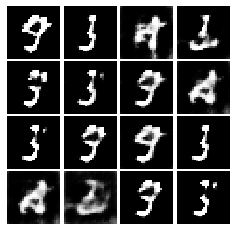

Epoch: 0, Iter: 400, D: 0.7839, G:2.929


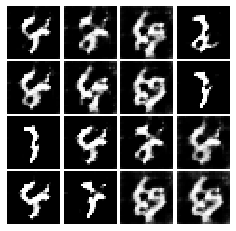

Epoch: 0, Iter: 420, D: 0.4445, G:3.964


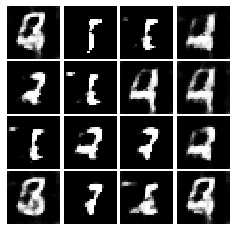

Epoch: 0, Iter: 440, D: 0.3842, G:2.57


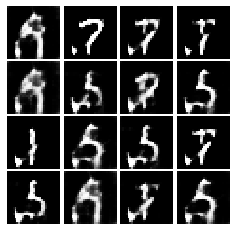

Epoch: 0, Iter: 460, D: 0.5924, G:5.224


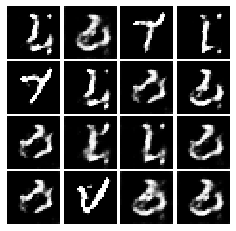

Epoch: 1, Iter: 480, D: 0.3942, G:3.047


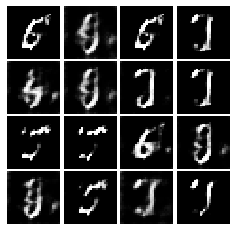

Epoch: 1, Iter: 500, D: 0.5681, G:4.171


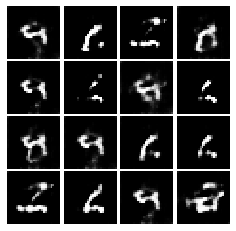

Epoch: 1, Iter: 520, D: 0.3635, G:2.648


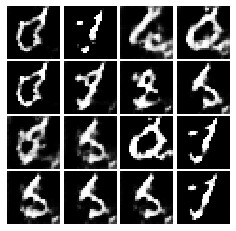

Epoch: 1, Iter: 540, D: 0.548, G:2.566


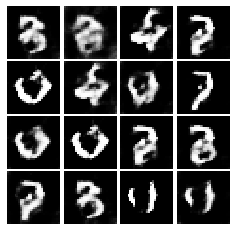

Epoch: 1, Iter: 560, D: 1.677, G:0.6778


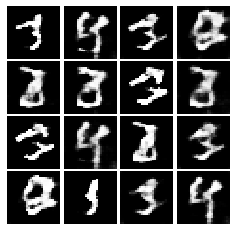

Epoch: 1, Iter: 580, D: 0.6677, G:4.227


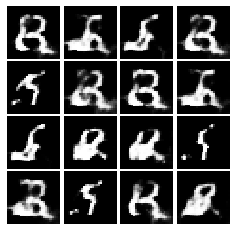

Epoch: 1, Iter: 600, D: 0.5365, G:2.143


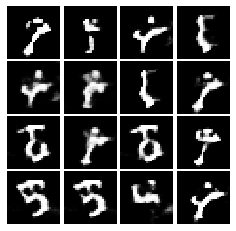

Epoch: 1, Iter: 620, D: 0.5527, G:2.331


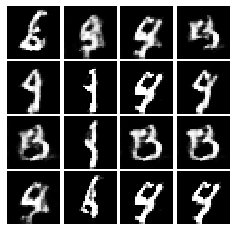

Epoch: 1, Iter: 640, D: 0.3794, G:2.962


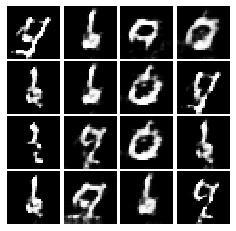

Epoch: 1, Iter: 660, D: 0.7975, G:1.191


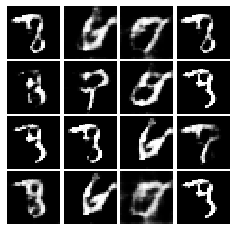

Epoch: 1, Iter: 680, D: 0.6192, G:4.296


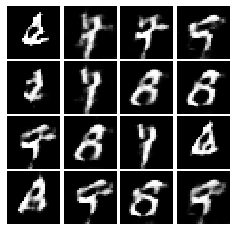

Epoch: 1, Iter: 700, D: 0.3225, G:2.909


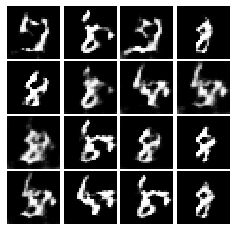

Epoch: 1, Iter: 720, D: 1.05, G:4.911


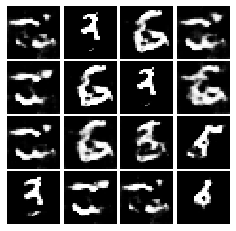

Epoch: 1, Iter: 740, D: 0.6783, G:4.346


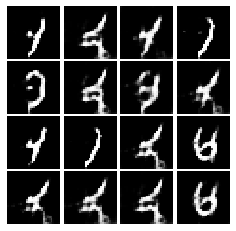

Epoch: 1, Iter: 760, D: 0.468, G:2.479


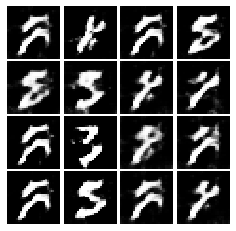

Epoch: 1, Iter: 780, D: 0.6758, G:4.914


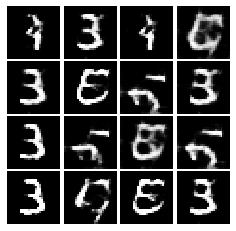

Epoch: 1, Iter: 800, D: 0.2564, G:3.577


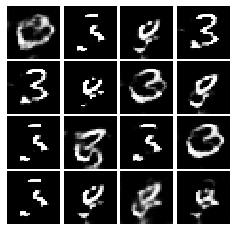

Epoch: 1, Iter: 820, D: 0.3455, G:3.126


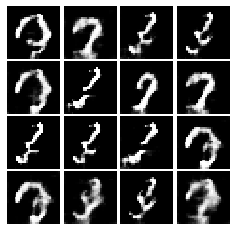

Epoch: 1, Iter: 840, D: 0.3439, G:3.371


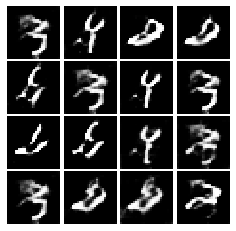

Epoch: 1, Iter: 860, D: 0.7963, G:3.198


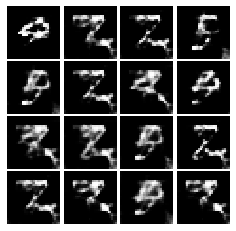

Epoch: 1, Iter: 880, D: 0.4009, G:4.743


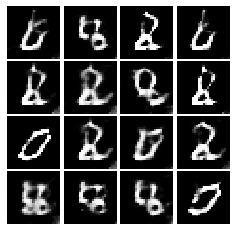

Epoch: 1, Iter: 900, D: 0.3994, G:2.418


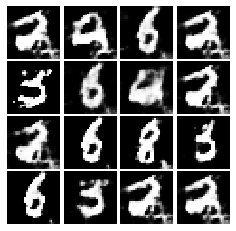

Epoch: 1, Iter: 920, D: 0.426, G:4.037


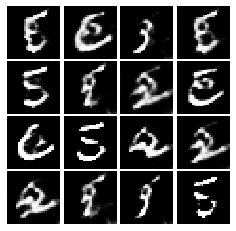

Epoch: 2, Iter: 940, D: 0.871, G:5.167


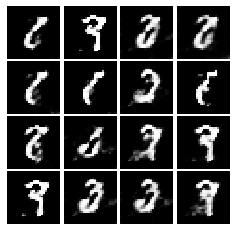

Epoch: 2, Iter: 960, D: 0.2654, G:3.586


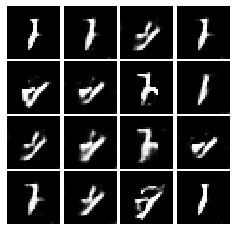

Epoch: 2, Iter: 980, D: 0.5792, G:2.56


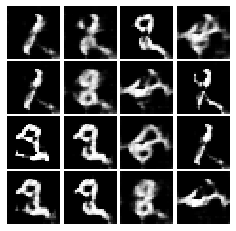

Epoch: 2, Iter: 1000, D: 0.4481, G:2.613


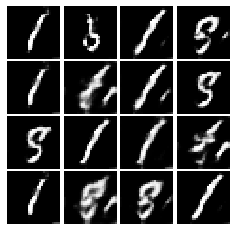

Epoch: 2, Iter: 1020, D: 0.4003, G:3.185


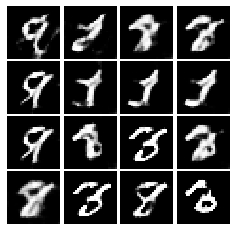

Epoch: 2, Iter: 1040, D: 0.4951, G:2.298


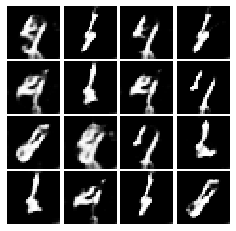

Epoch: 2, Iter: 1060, D: 0.3097, G:2.68


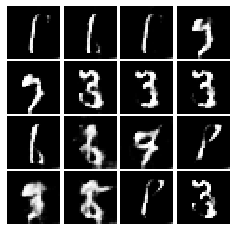

Epoch: 2, Iter: 1080, D: 0.5414, G:3.447


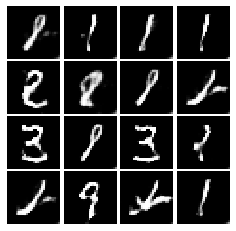

Epoch: 2, Iter: 1100, D: 0.3544, G:3.084


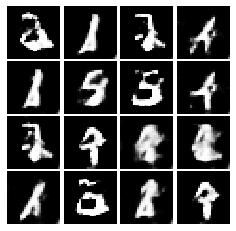

Epoch: 2, Iter: 1120, D: 0.3561, G:2.974


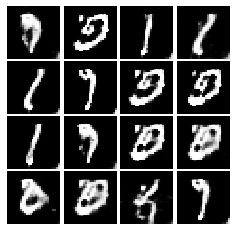

Epoch: 2, Iter: 1140, D: 0.7518, G:3.828


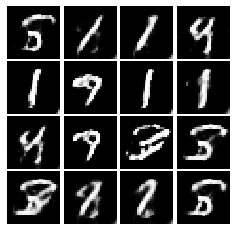

Epoch: 2, Iter: 1160, D: 0.5925, G:6.041


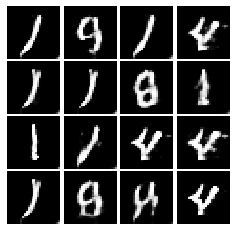

Epoch: 2, Iter: 1180, D: 0.5181, G:3.717


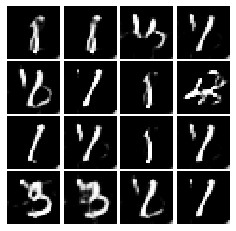

Epoch: 2, Iter: 1200, D: 0.4349, G:3.314


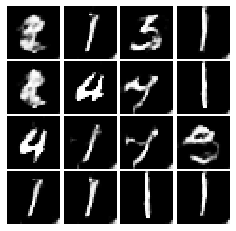

Epoch: 2, Iter: 1220, D: 0.4254, G:2.076


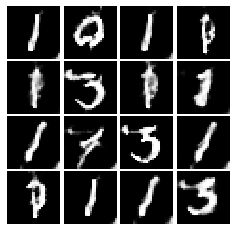

Epoch: 2, Iter: 1240, D: 0.448, G:2.374


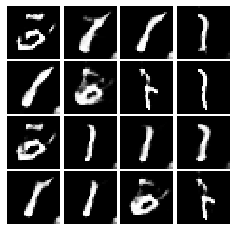

Epoch: 2, Iter: 1260, D: 0.4875, G:2.834


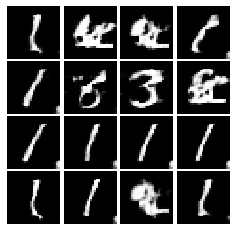

Epoch: 2, Iter: 1280, D: 0.4575, G:2.917


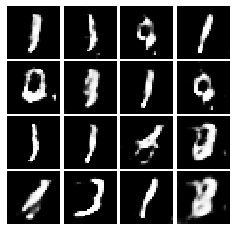

Epoch: 2, Iter: 1300, D: 0.368, G:2.324


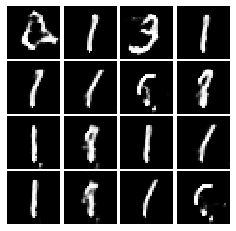

Epoch: 2, Iter: 1320, D: 0.6609, G:2.138


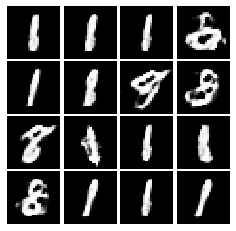

Epoch: 2, Iter: 1340, D: 0.4179, G:2.914


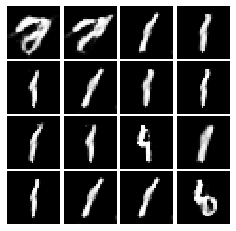

Epoch: 2, Iter: 1360, D: 0.9982, G:3.228


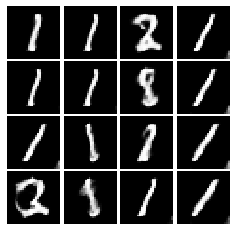

Epoch: 2, Iter: 1380, D: 0.5382, G:3.326


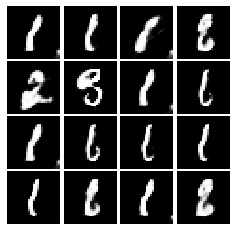

Epoch: 2, Iter: 1400, D: 0.5971, G:1.472


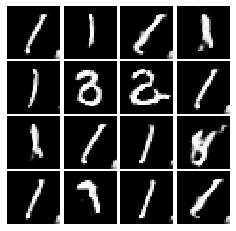

Final images


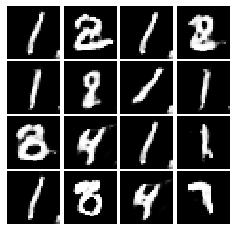

In [56]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=3)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2    |  1     |  -1     |   -2    |   -1    |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1    |   -2    |   -1    |   1    |   2    |   1    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
We can notice a cycle here which will repeat itself every 6 iterations and therefore it's not possible to reach the optimal values of x and y


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

No, it is not a good sign, since the discriminator is not learning to recoginse real samples from noisy images. So even if the generator model is constantly producing noisy images, it is possible for the generator to fool the discriminator.
